# Data Description

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

Attribute Information:

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

Please note that there are two target variables here: 

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature

# Importing required libraries

In [24]:
pip install pandas-compat

Note: you may need to restart the kernel to use updated packages.


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Loading dataset

In [26]:
df=pd.read_csv('temperature.csv',parse_dates = ['Date'])

In [27]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [28]:
df.shape

(7752, 25)

There are 7752 rows and 25 columns

In [29]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

There are lot of null values in the dataset

In [30]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

We have float64 for all the datatypes except Date

In [31]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


From this, we can see that, there are lot of missing values in the data.
Also there are too many outliers and skewness in the data.

In [12]:
df.apply(lambda i: len(i.unique()))

station               26
Date                 311
Present_Tmax         168
Present_Tmin         156
LDAPS_RHmin         7673
LDAPS_RHmax         7665
LDAPS_Tmax_lapse    7676
LDAPS_Tmin_lapse    7676
LDAPS_WS            7676
LDAPS_LH            7676
LDAPS_CC1           7570
LDAPS_CC2           7583
LDAPS_CC3           7600
LDAPS_CC4           7525
LDAPS_PPT1          2813
LDAPS_PPT2          2511
LDAPS_PPT3          2357
LDAPS_PPT4          1919
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            184
Next_Tmin            158
dtype: int64

In [32]:
df['Day'] = df['Date'].dt.day

In [33]:
df['Month'] = df['Date'].dt.month

In [34]:
df.drop('Date',axis=1,inplace=True)

In [35]:
df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2,30.0,6.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5,30.0,6.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9,30.0,6.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3,30.0,6.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5,30.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1,30.0,8.0
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8,30.0,8.0
7749,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,...,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4,30.0,8.0
7750,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3,NaN,NaN


# Handling missing values

In [38]:
df['Day'].fillna(df['Day'].mode()[0], inplace=True)

In [ ]:
df['Month'].fillna(df['Month'].mode()[0], inplace=True)

In [39]:
df.dropna(subset=['Next_Tmax', 'Next_Tmin'], inplace = True)

In [40]:
from sklearn.impute import SimpleImputer

In [41]:
SI=SimpleImputer()

In [42]:
df_1 = SI.fit_transform(df)

In [43]:
df_1 = pd.DataFrame(df_1,columns=df.columns)

In [44]:
df_1.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
dtype: int64

In [45]:
df=df_1

In [47]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month'],
      dtype='object')

# Checking the Correlation

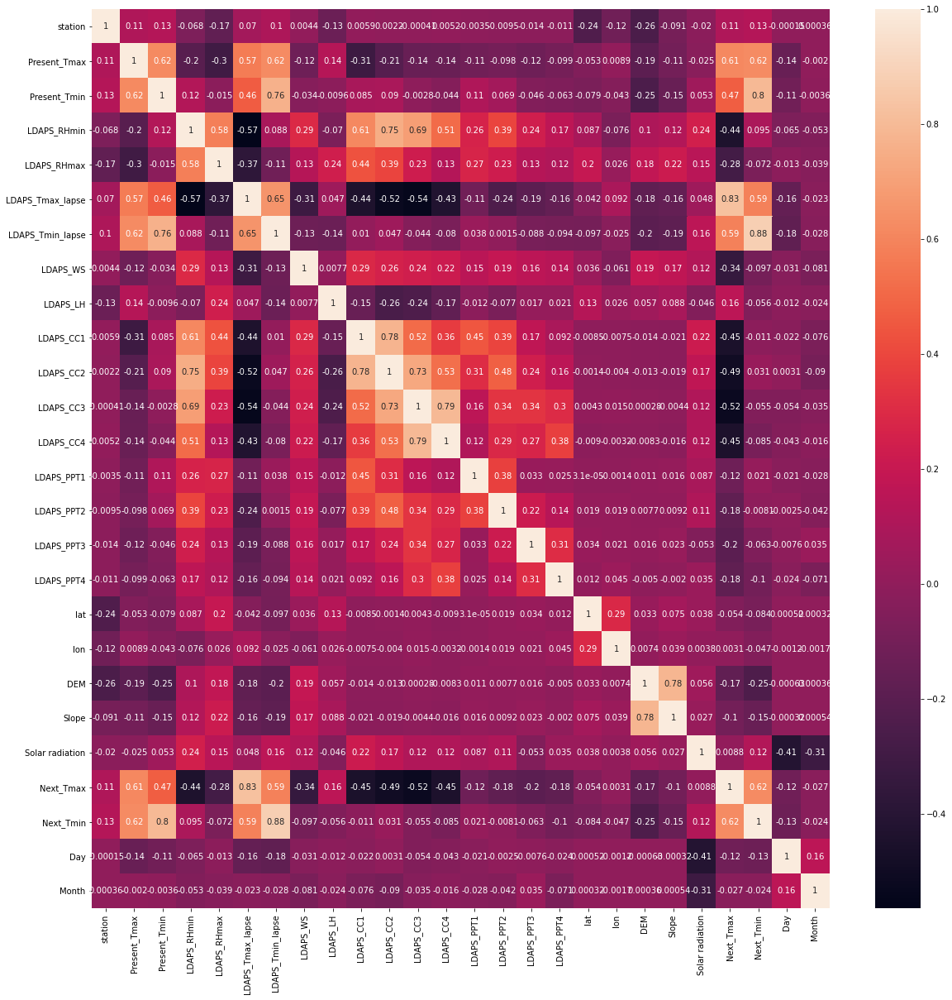

In [46]:
plt.figure(figsize=[20,20])
sns.heatmap(df.corr(),annot=True)
plt.show()

Observations:
- Present_Tmax is positively correlated to Next_Tmax,Next_Tmin, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmin.
- Present_Tmin is positively correlated to Next_Tmin,Next_Tmax, LDAPS_Tmin_lapse, LDAPS_Tmax_lapse, Present_Tmax.
- LDAPS_RHmin is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse and positively correlated to LDAPS_RHmax,LDAPS_CC1,
  LDAPS_CC2,LDAPS_CC3,LDAPS_CC4.
- LDAPS_RHmax is positively correlated to LDAPS_RHmin.
- LDAPS_Tmax_lapse is positively correlated to Next_Tmin,Next_Tmax,LDAPS_Tmin_lapse,Present_Tmax,Present_Tmin and negatively
  correlated to LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4,LDAPS_RHmin.
- LDAPS_Tmin_lapse is positively correlated to Next_Tmin,Next_Tmax,LDAPS_Tmax_lapse,Present_Tmax and Present_Tmin.
- LDAPS_WS is negatively correlated to Next_Tmax, LDAPS_Tmax_lapse.
- LDAPS_CC1 is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse,Present_Tmax and positively correlated to LDAPS_RHmin,
  LDAPS_RHmax, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4.
- LDAPS_CC2 is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse and positively correlated to LDAPS_RHmin, LDAPS_RHmax, LDAPS_CC1, LDAPS_CC3, LDAPS_CC4.
- LDAPS_CC3 is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse and positively correlated to LDAPS_RHmin, LDAPS_RHmax, LDAPS_CC1, LDAPS_CC2, LDAPS_CC4.
- LDAPS_CC4 is negatively correlated to Next_Tmax,LDAPS_Tmax_lapse and positively correlated to LDAPS_RHmin, LDAPS_RHmax, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3.
- DEM and Slope are positively correlated to each other.
- Next_Tmax and NextTmin are positively correlated to each other.
- LDAPS_Tmax_lapse and LDAPS_Tmin_lapse are positively correlated to each other.
- Present_Tmax and Present_Tmin are positively correlated to each other.

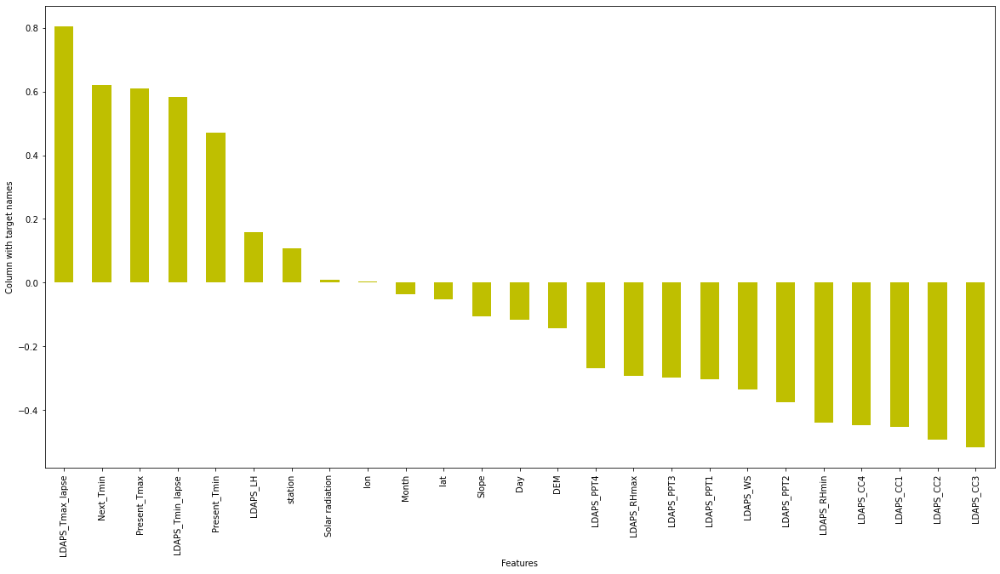

In [113]:
plt.figure(figsize = (20, 10))
df.corr()['Next_Tmax'].sort_values(ascending = False).drop(['Next_Tmax']).plot(kind = 'bar', color = 'y')
plt.xlabel('Features')
plt.ylabel('Column with target names')
plt.show()

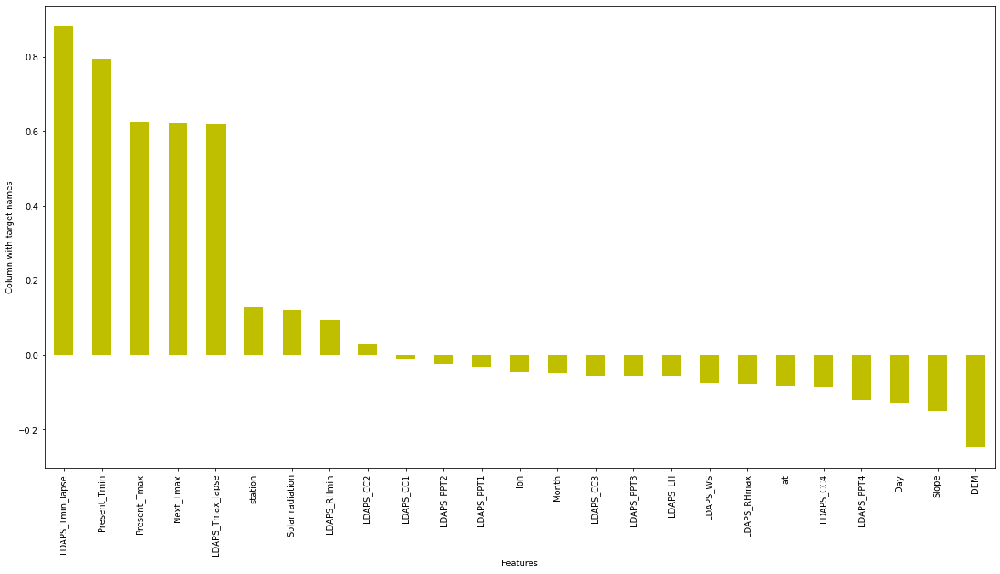

In [115]:
plt.figure(figsize = (20, 10))
df.corr()['Next_Tmin'].sort_values(ascending = False).drop(['Next_Tmin']).plot(kind = 'bar', color = 'y')
plt.xlabel('Features')
plt.ylabel('Column with target names')
plt.show()

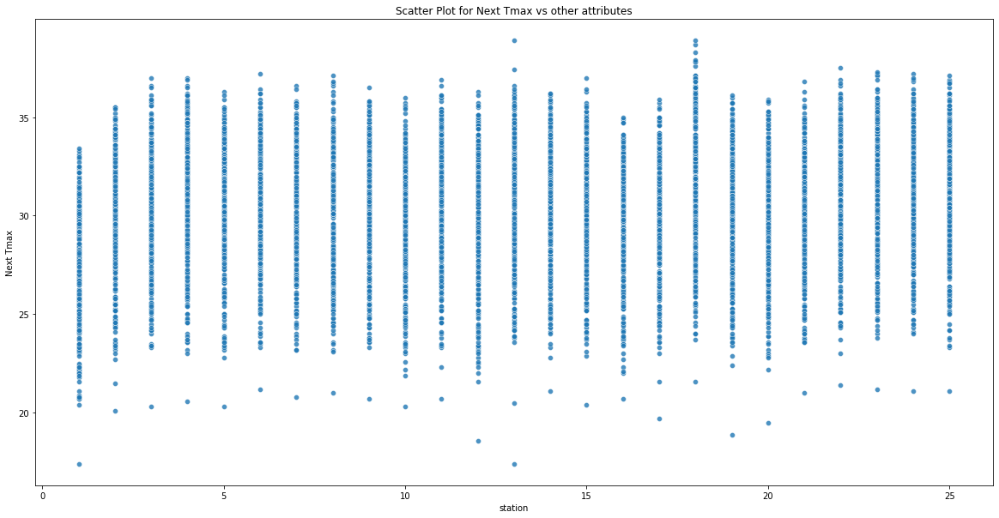

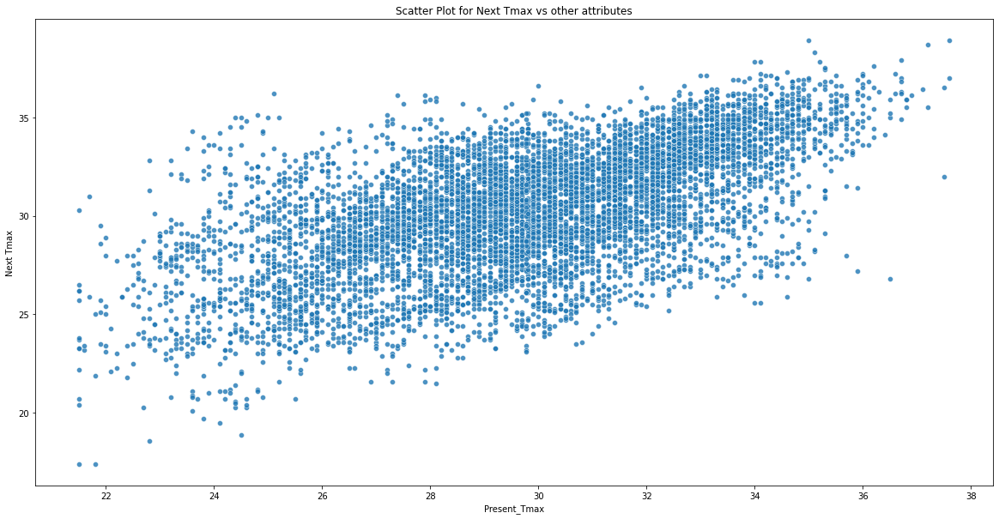

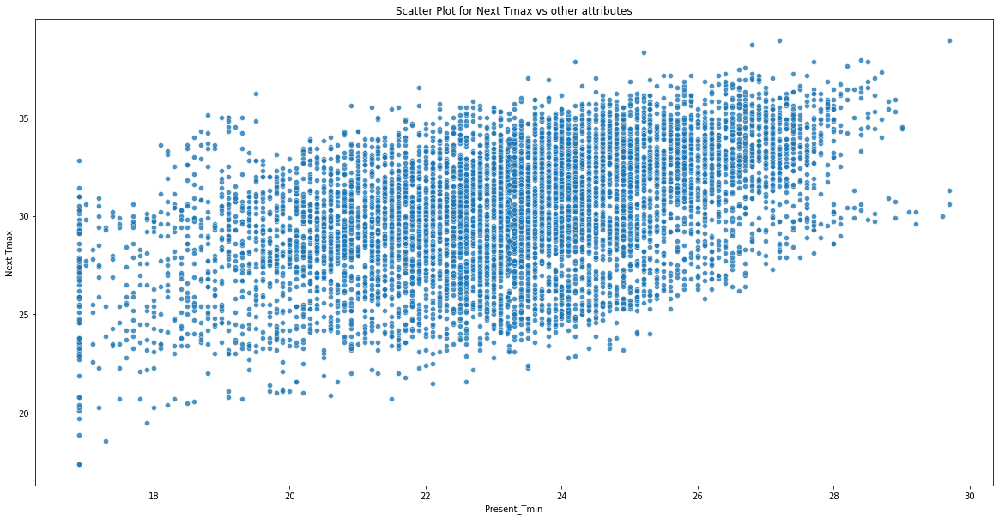

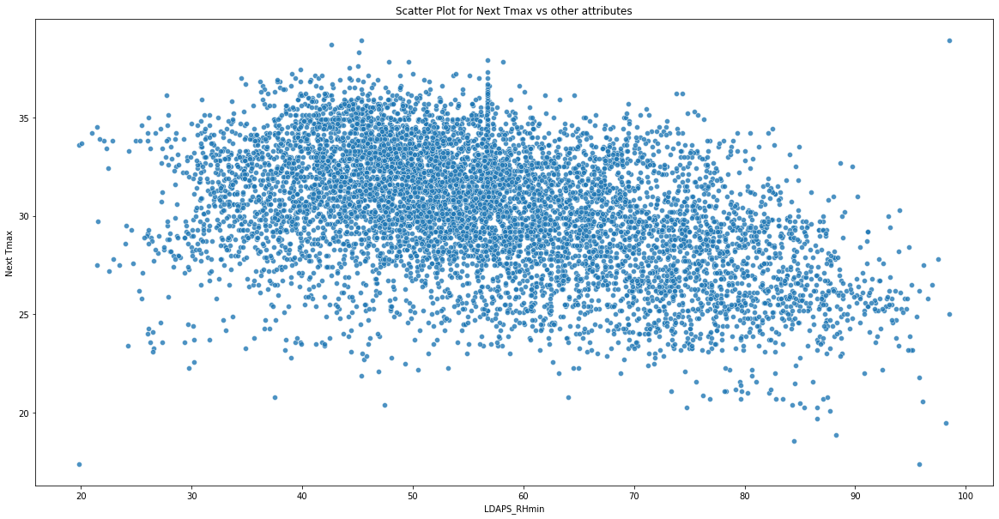

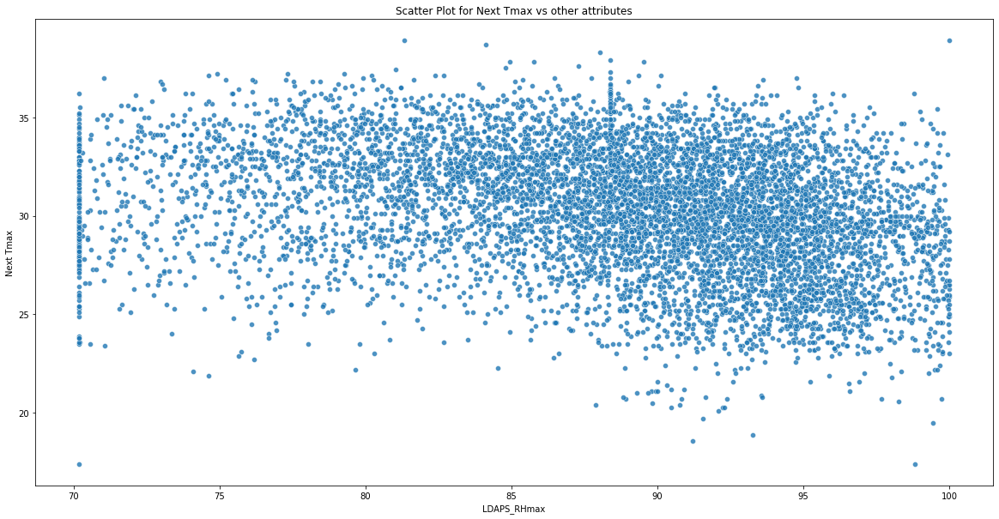

...

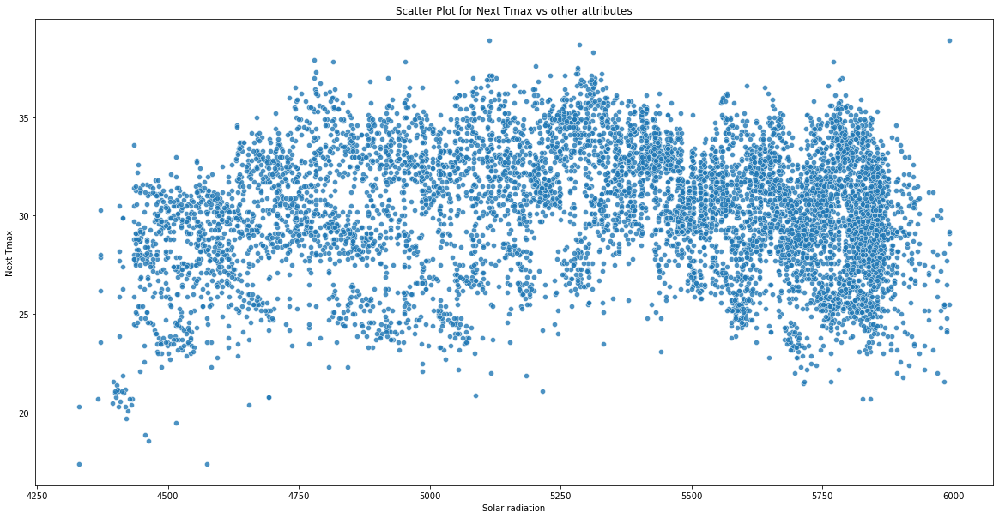

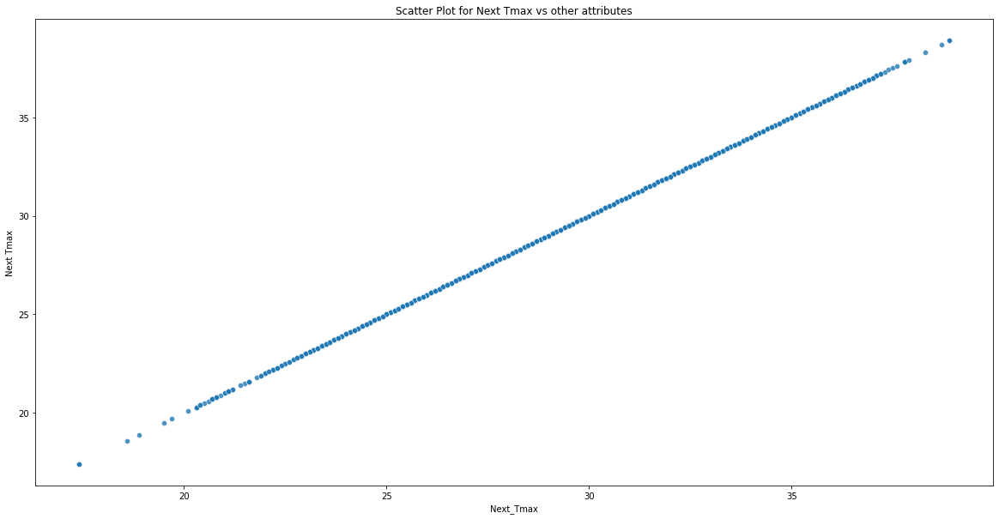

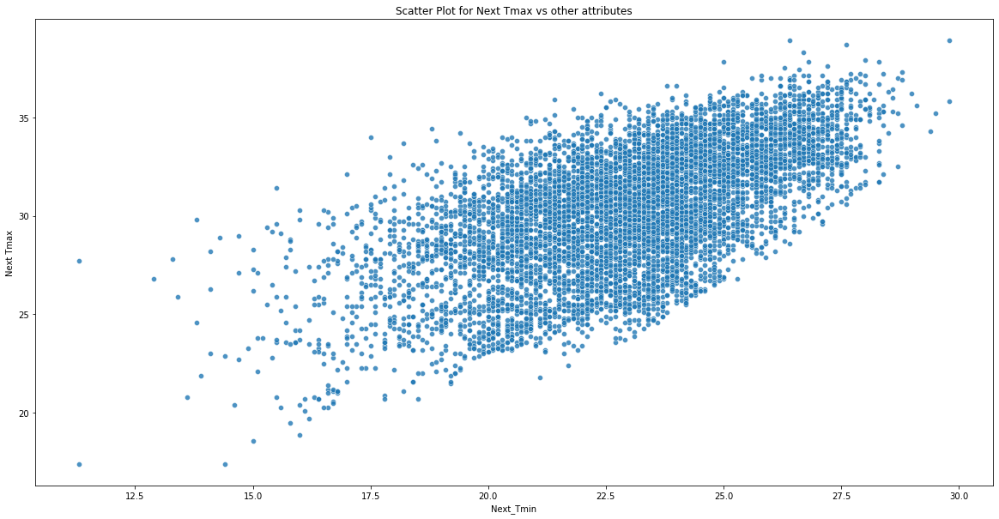

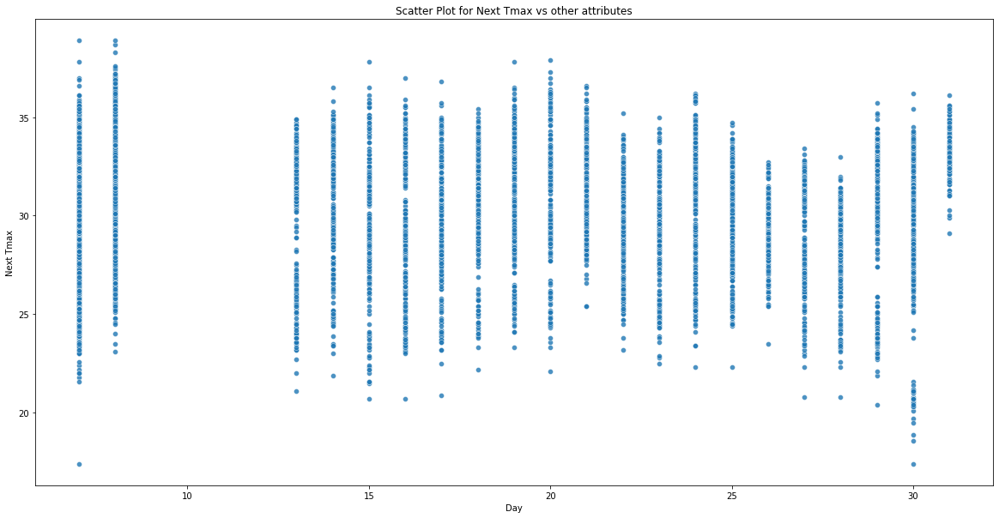

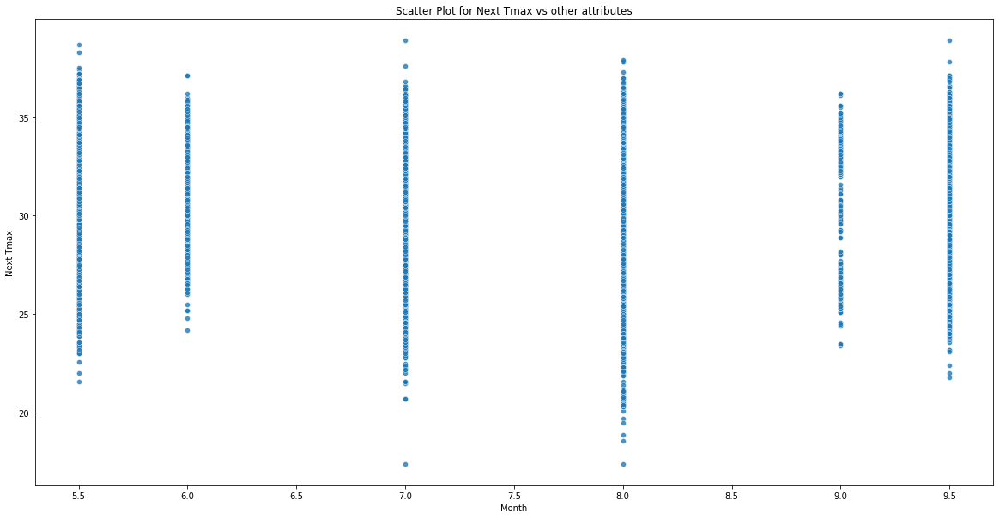

In [123]:
for i in df.columns:                                        
    plt.figure(figsize = (20, 10))
    sns.scatterplot(df[i], df['Next_Tmax'],alpha=0.8, edgecolors='r')
    plt.title('Scatter Plot for Next Tmax vs other attributes')
    plt.xlabel(i)
    plt.ylabel('Next Tmax')
    plt.show()

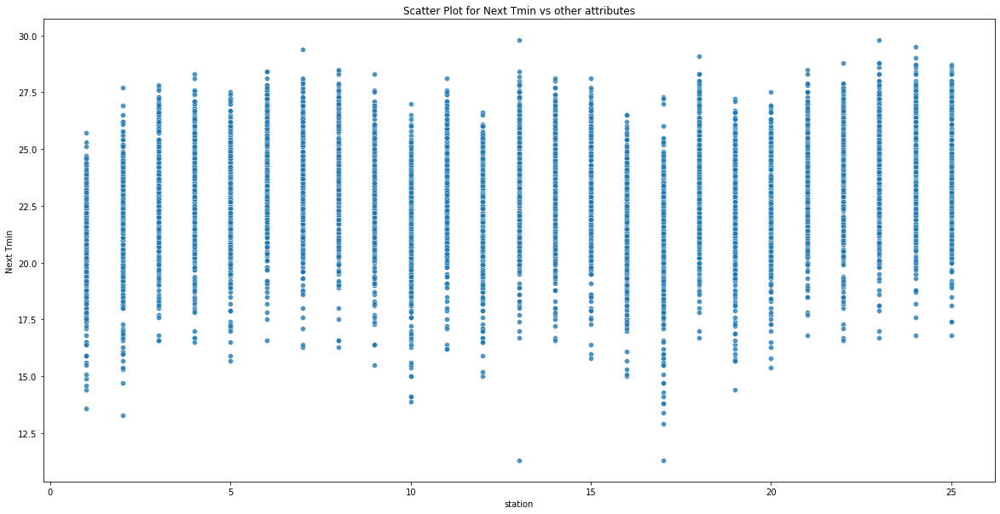

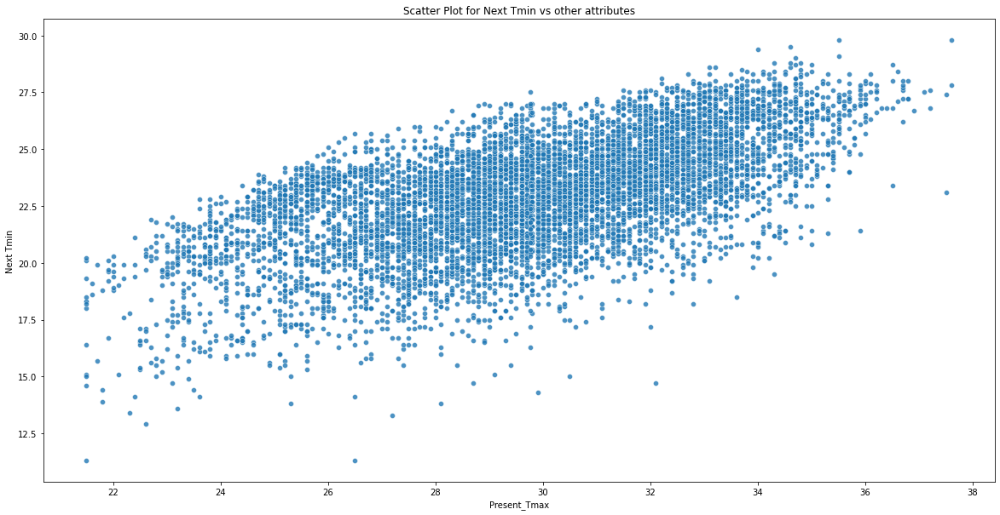

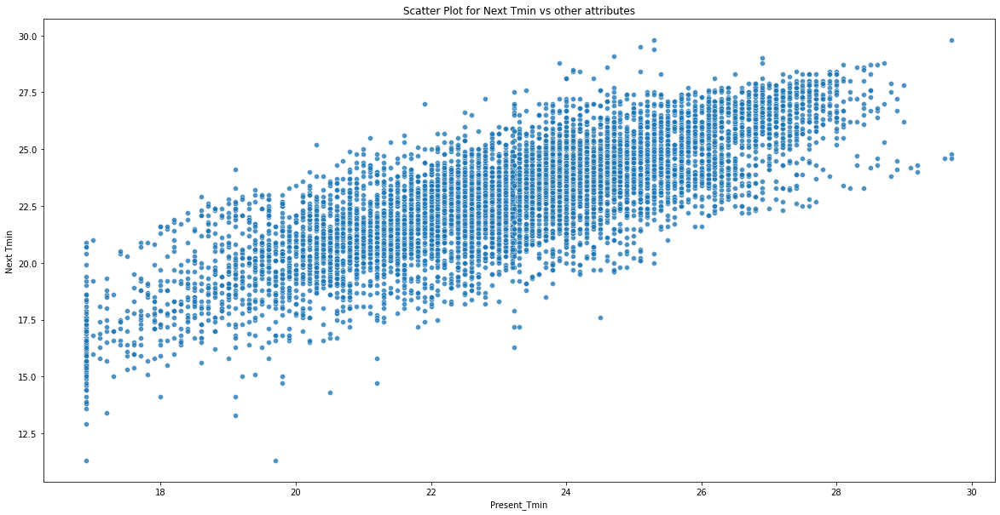

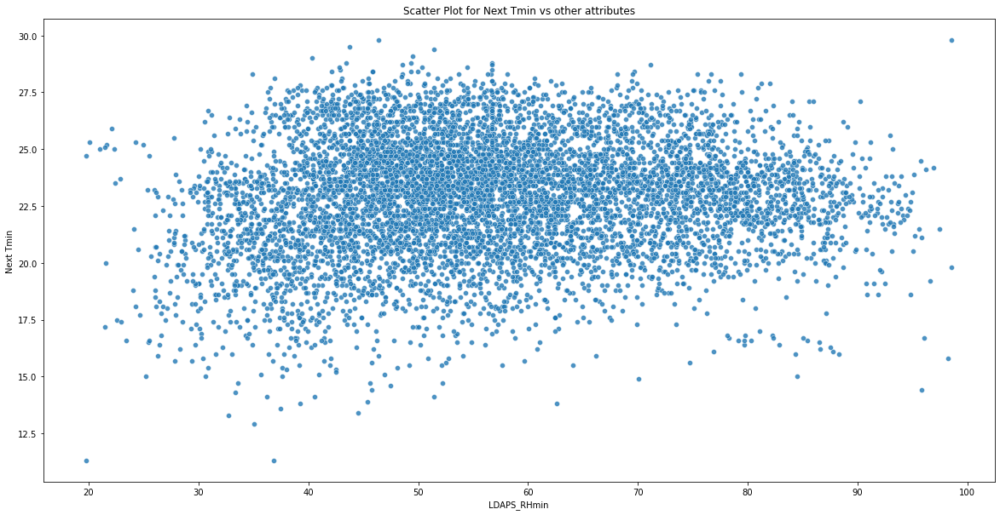

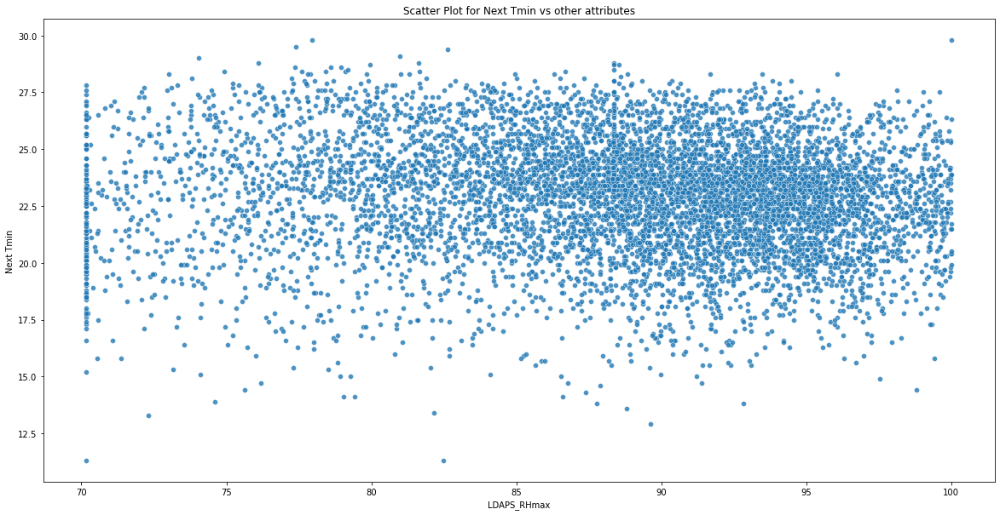

...

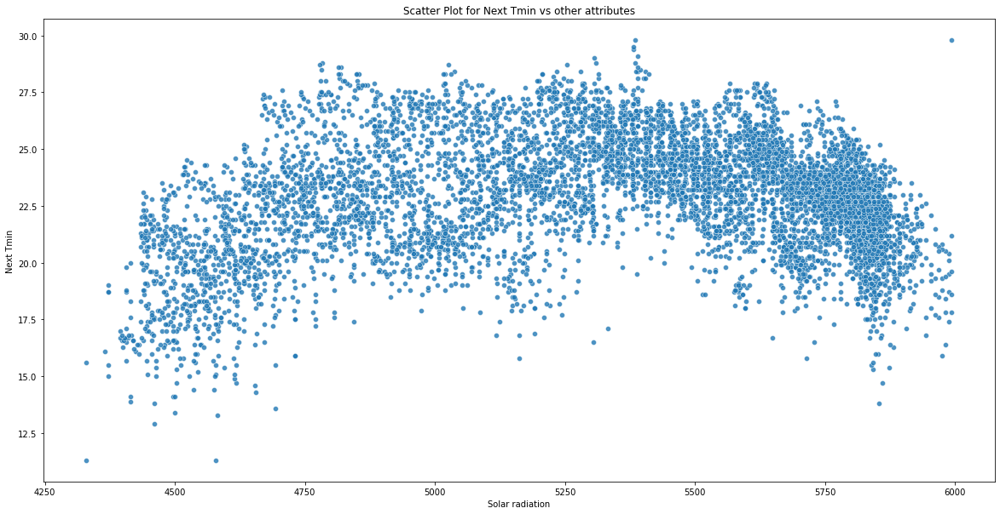

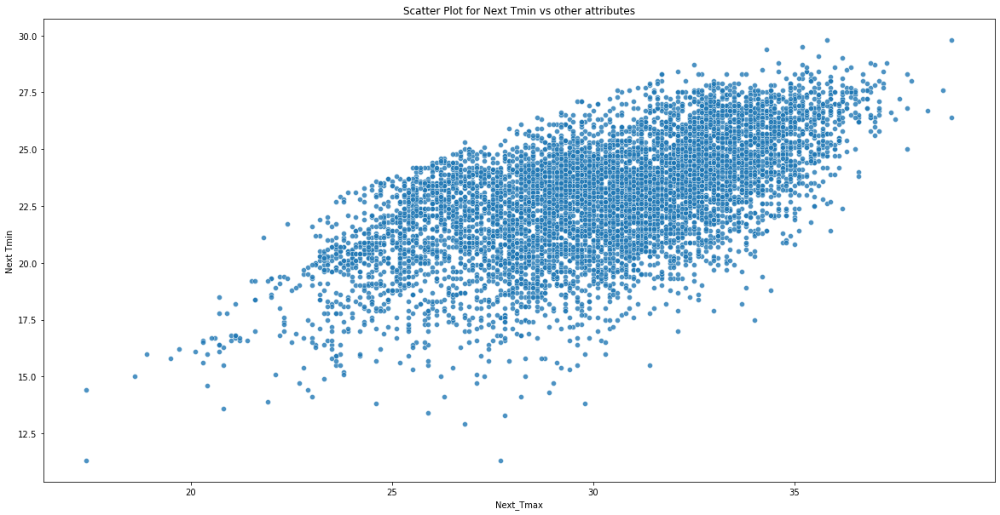

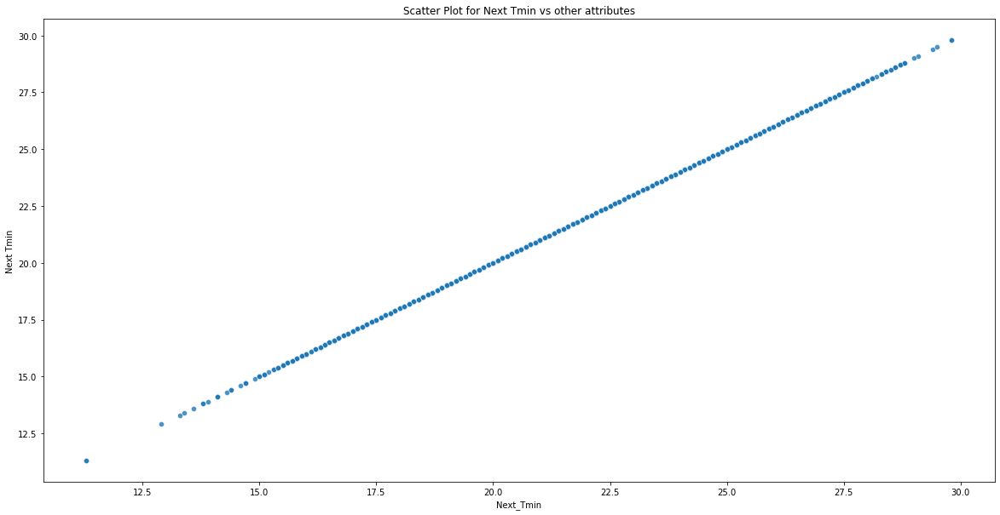

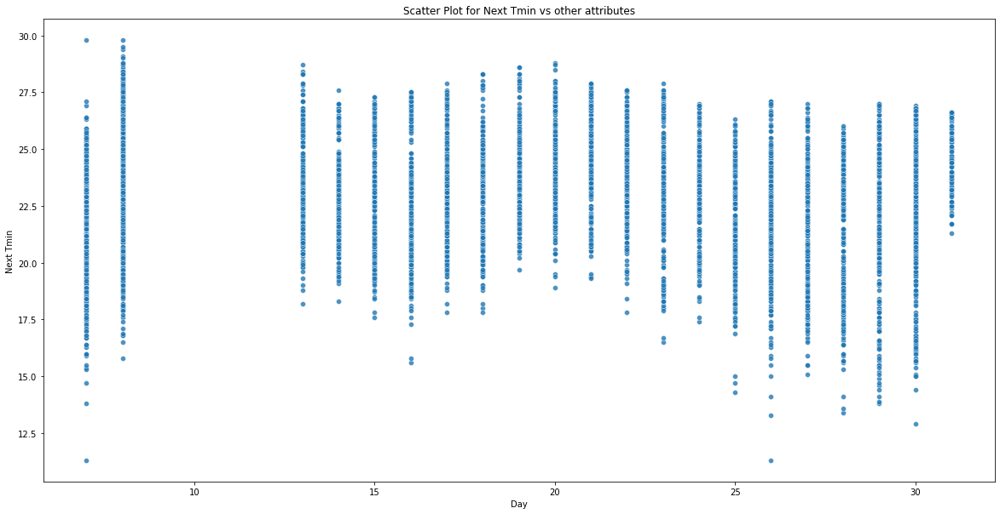

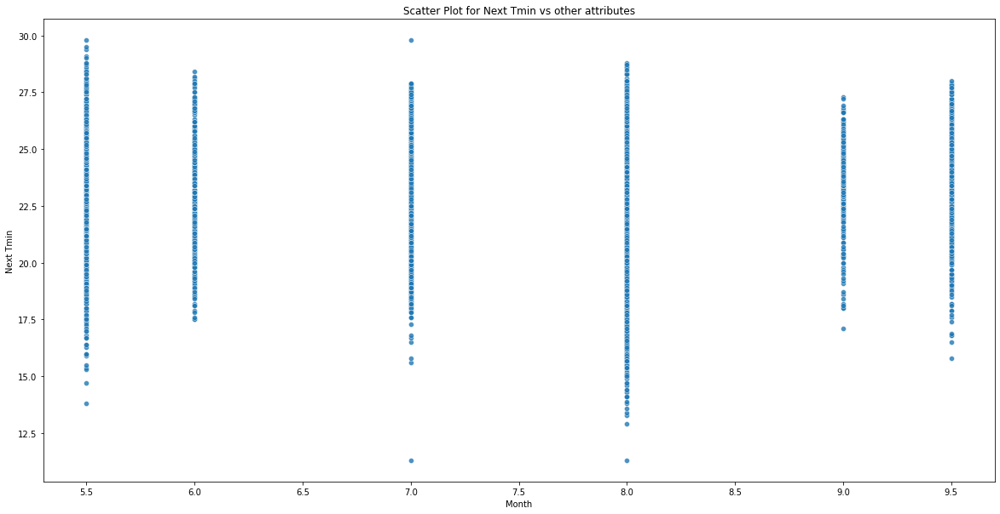

In [124]:
for i in df.columns:                                        
    plt.figure(figsize = (20, 10))
    sns.scatterplot(df[i], df['Next_Tmin'],alpha=0.8, edgecolors='r')
    plt.title('Scatter Plot for Next Tmin vs other attributes')
    plt.xlabel(i)
    plt.ylabel('Next Tmin')
    plt.show()

# Checking Data Distribution

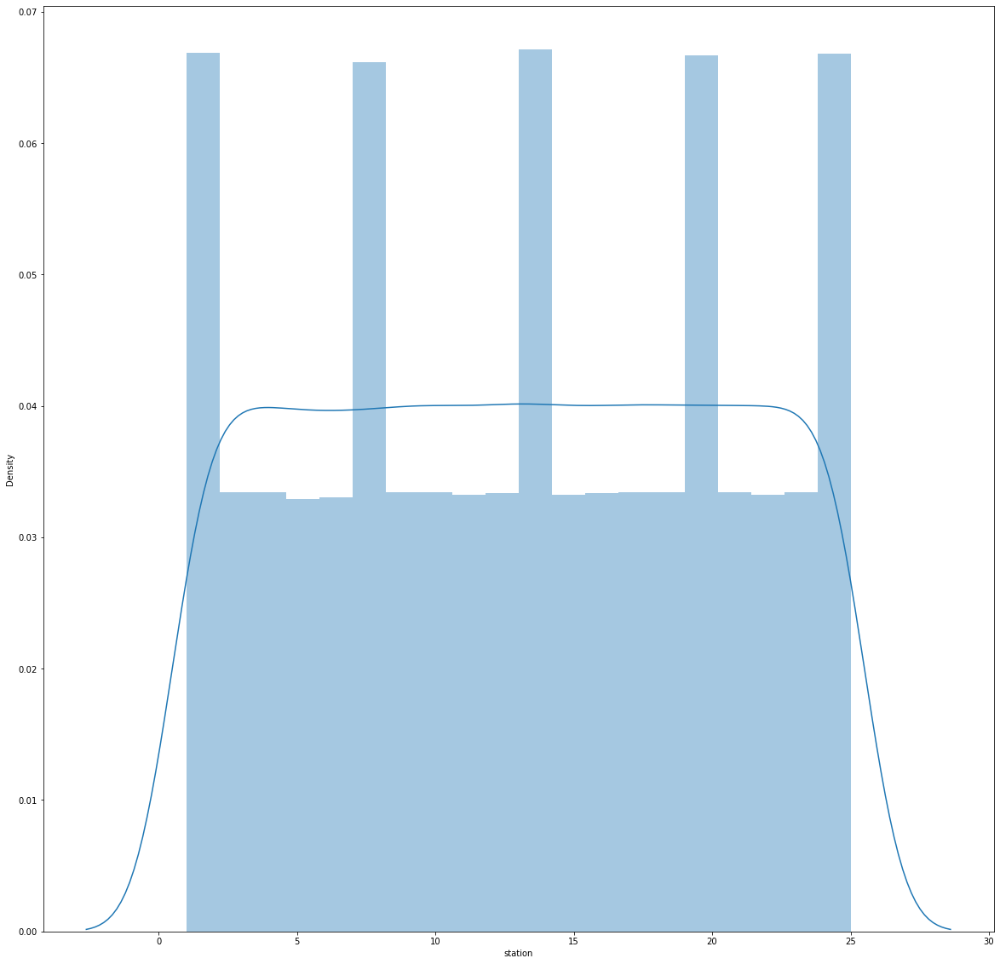

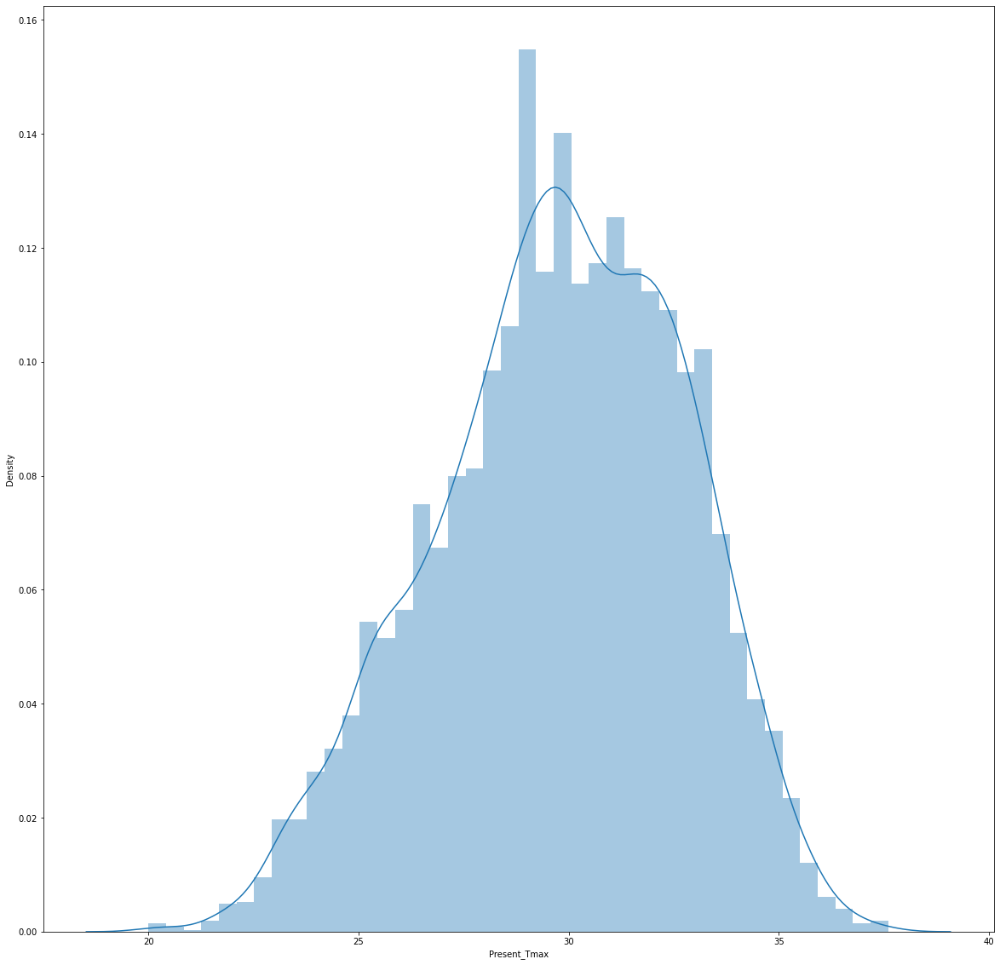

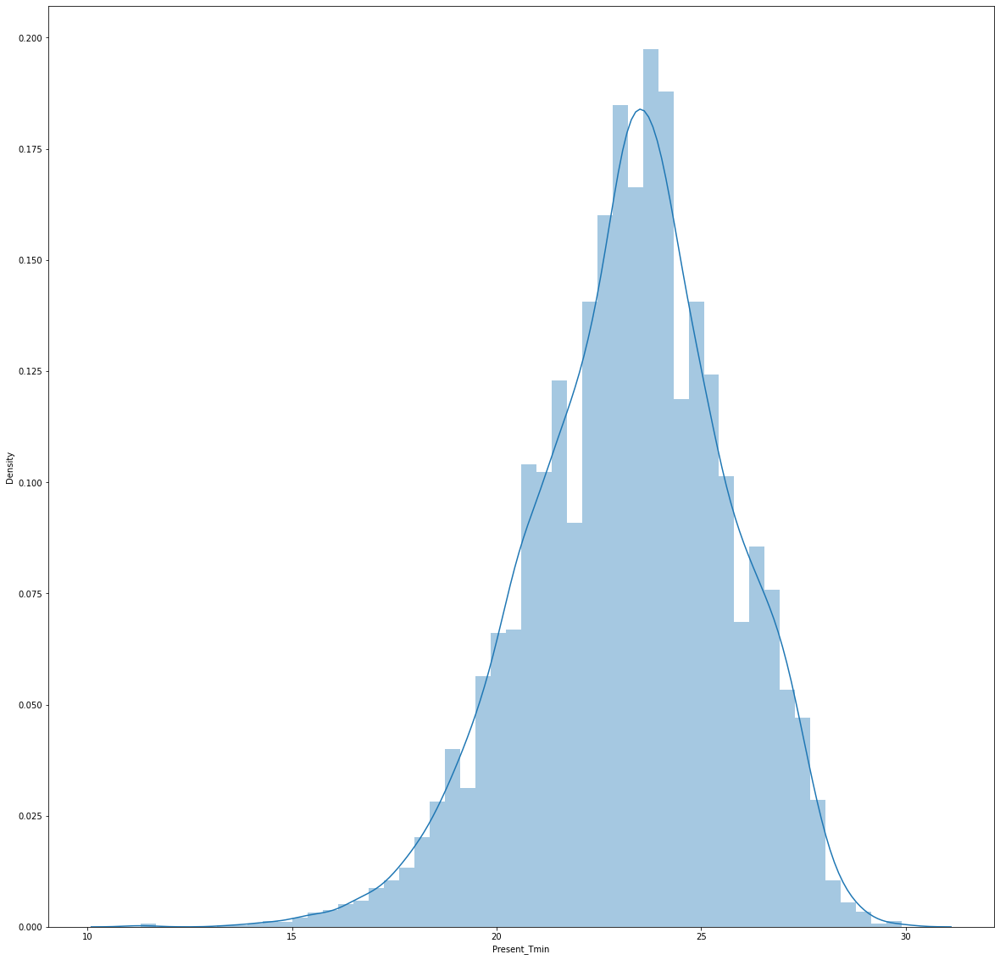

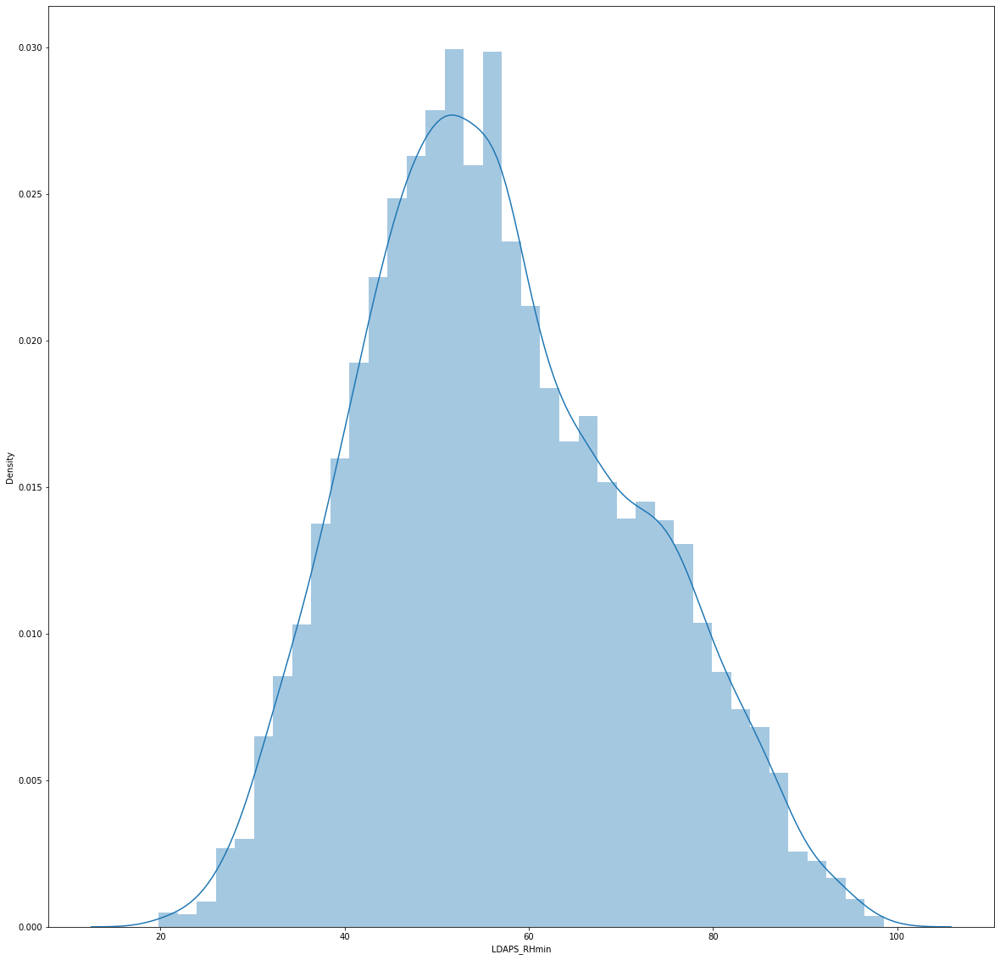

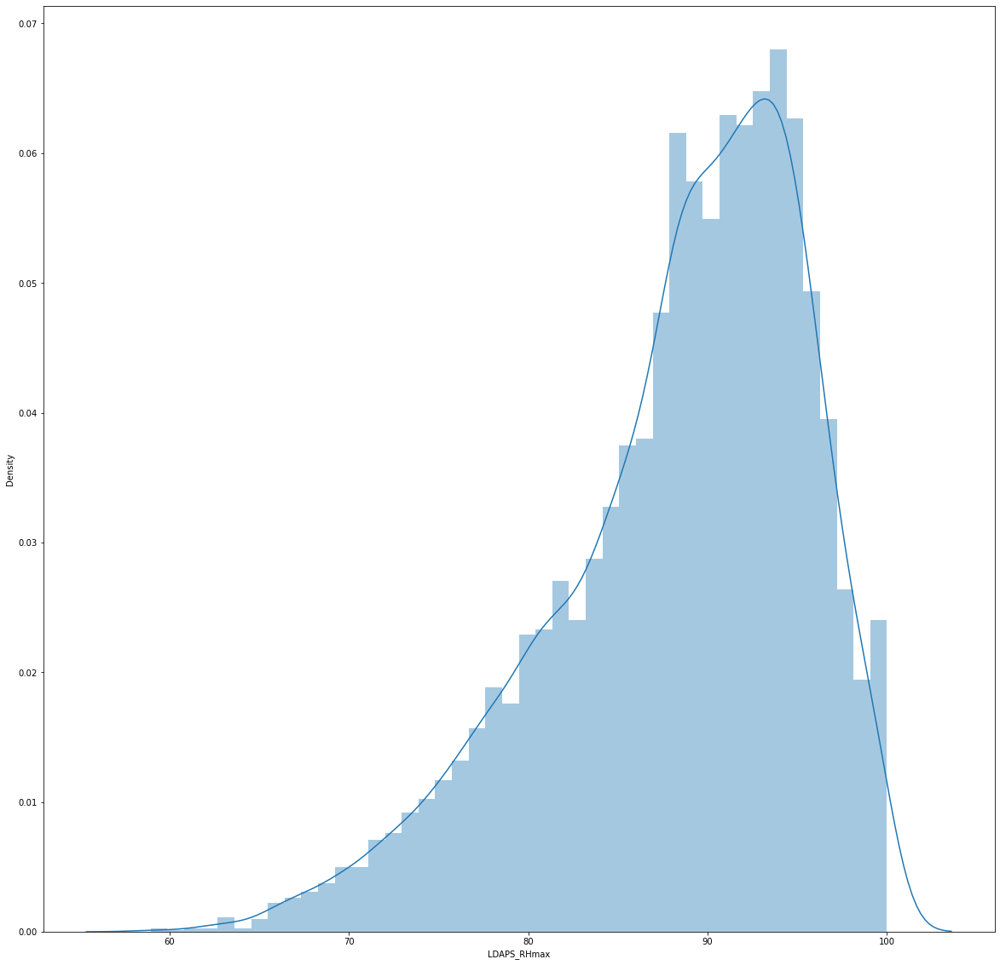

...

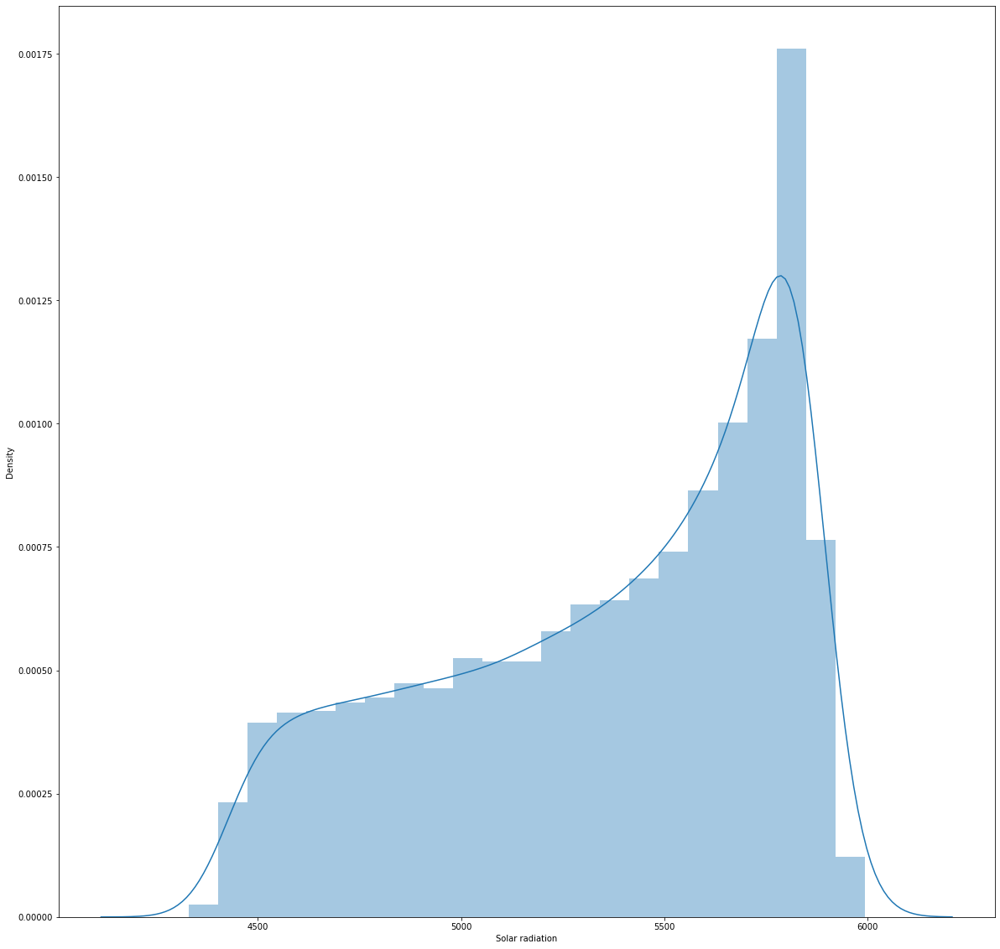

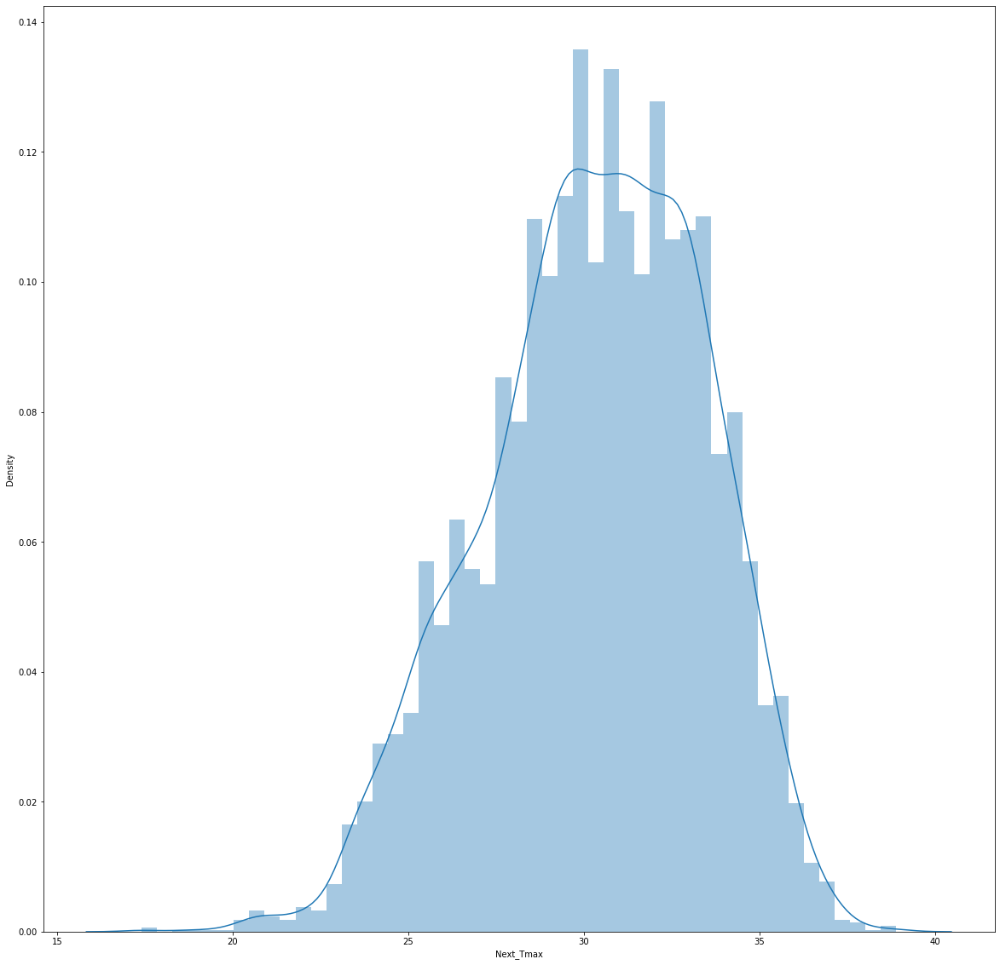

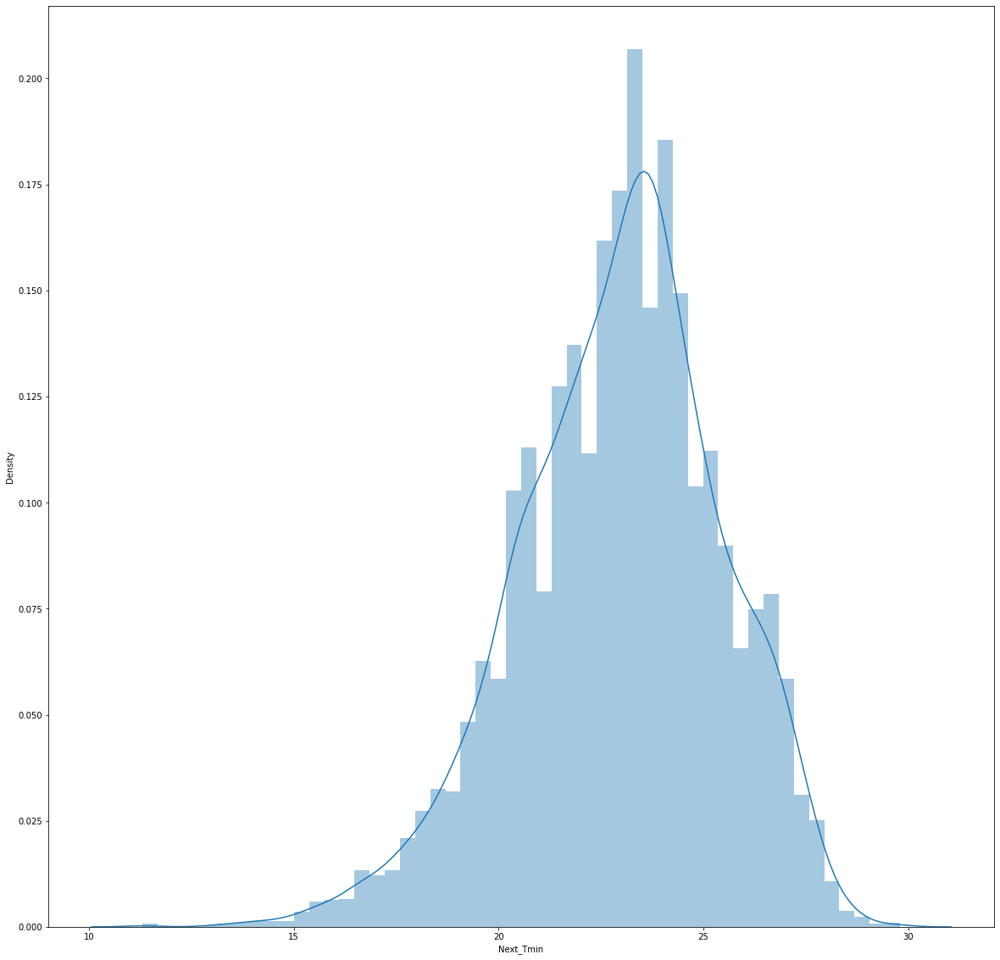

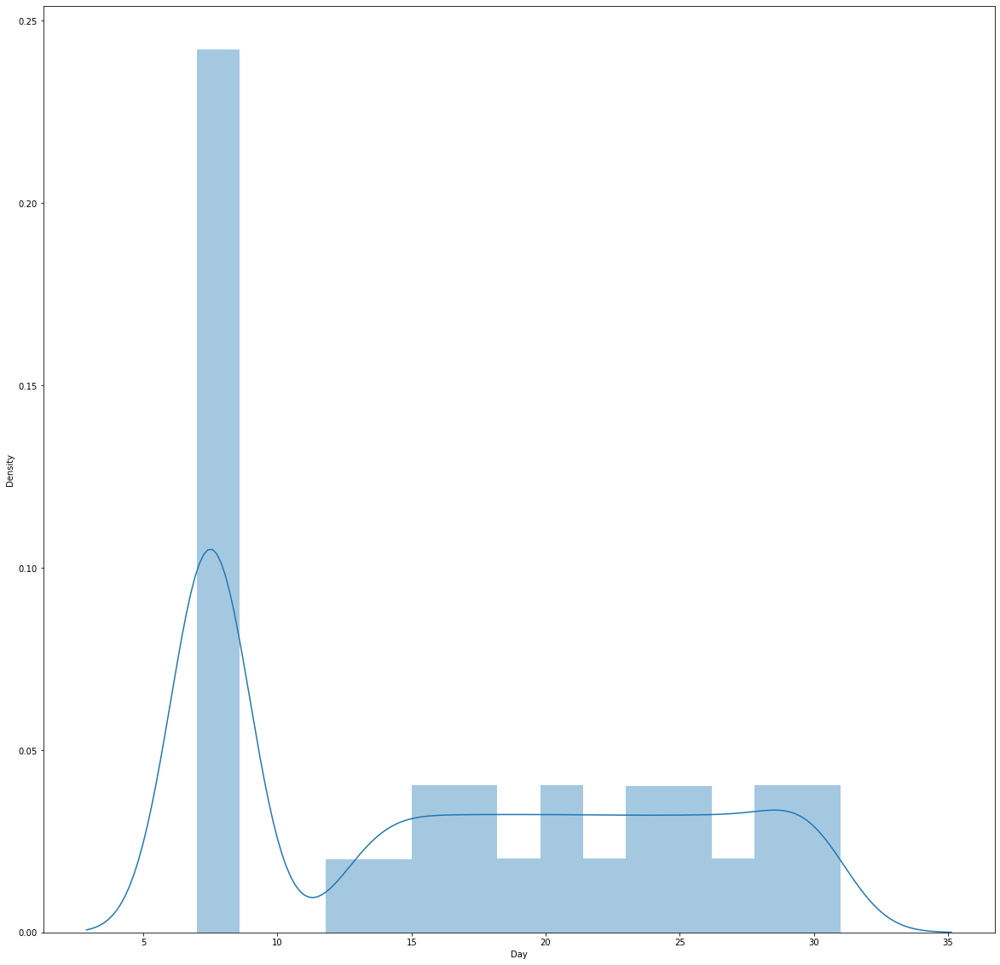

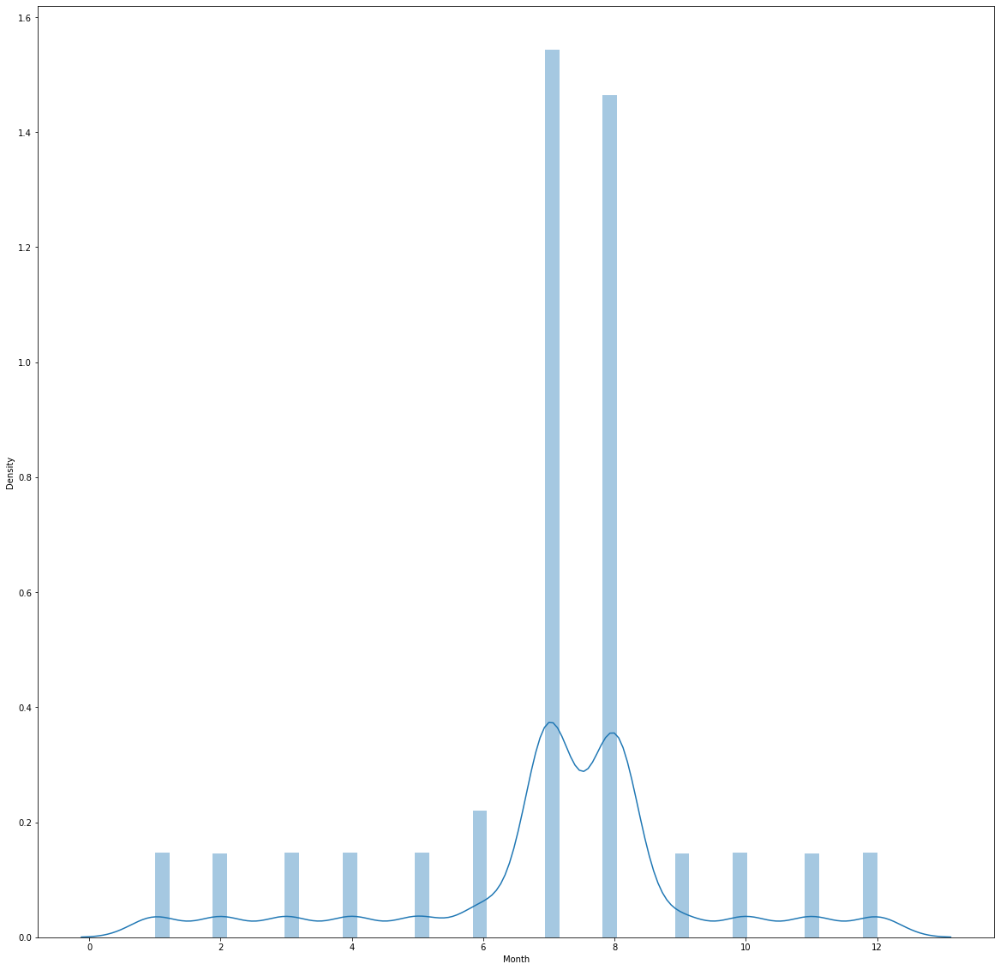

In [56]:
for i in df.columns:
    plt.figure(figsize=[20,20])
    sns.distplot(df[i])
    plt.show()

We can that there is some skewness in the data.

# Checking Outliers

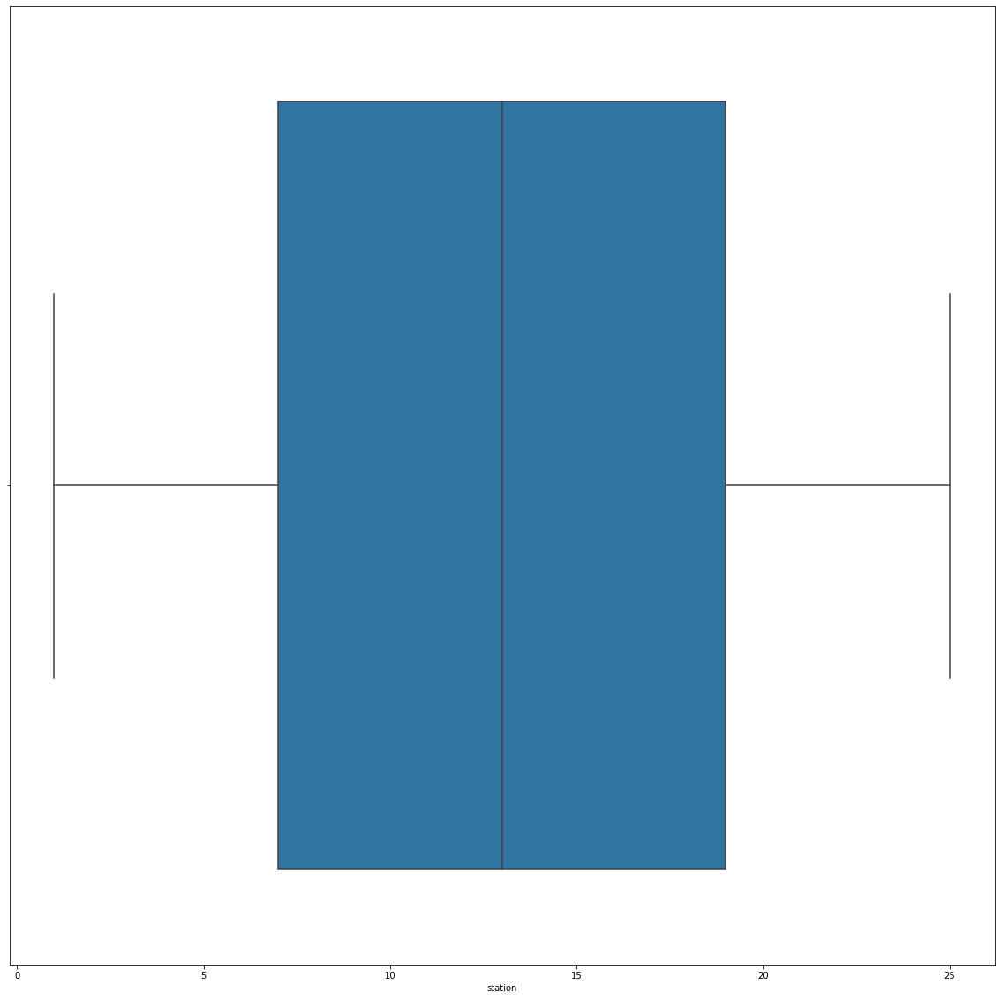

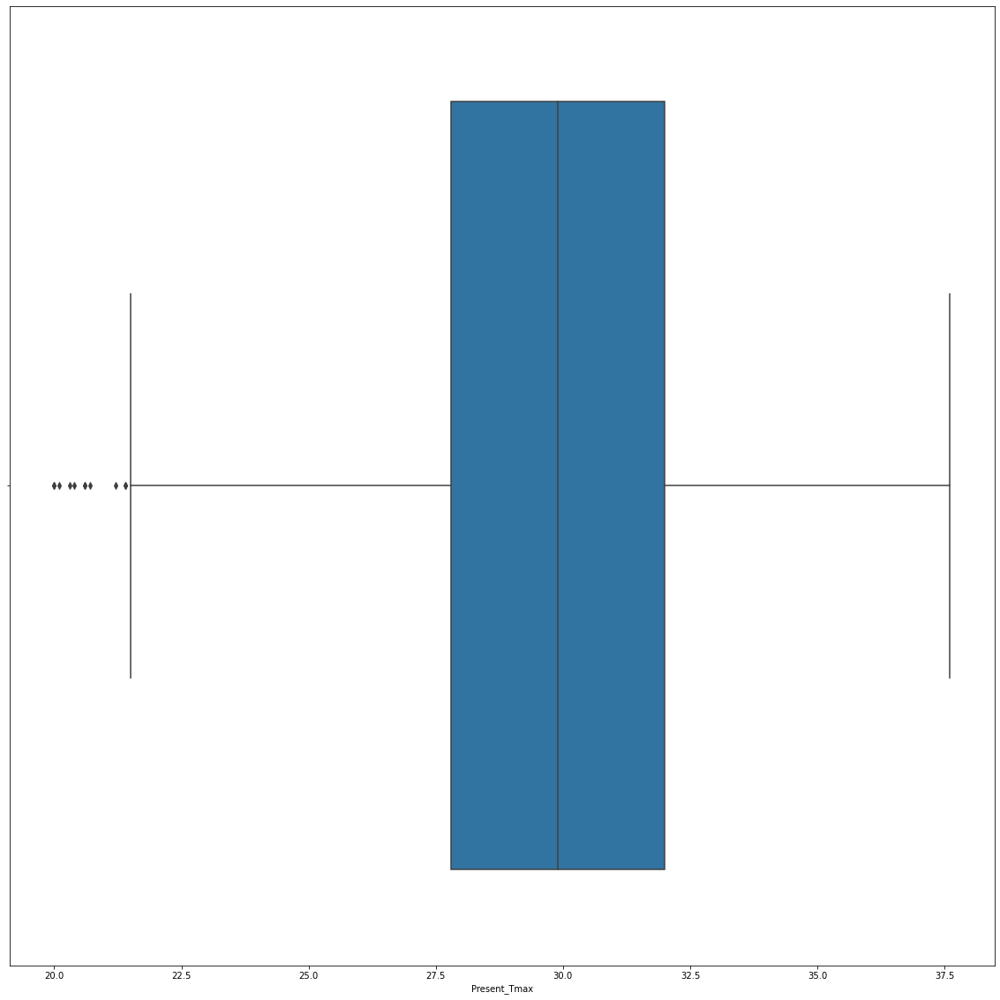

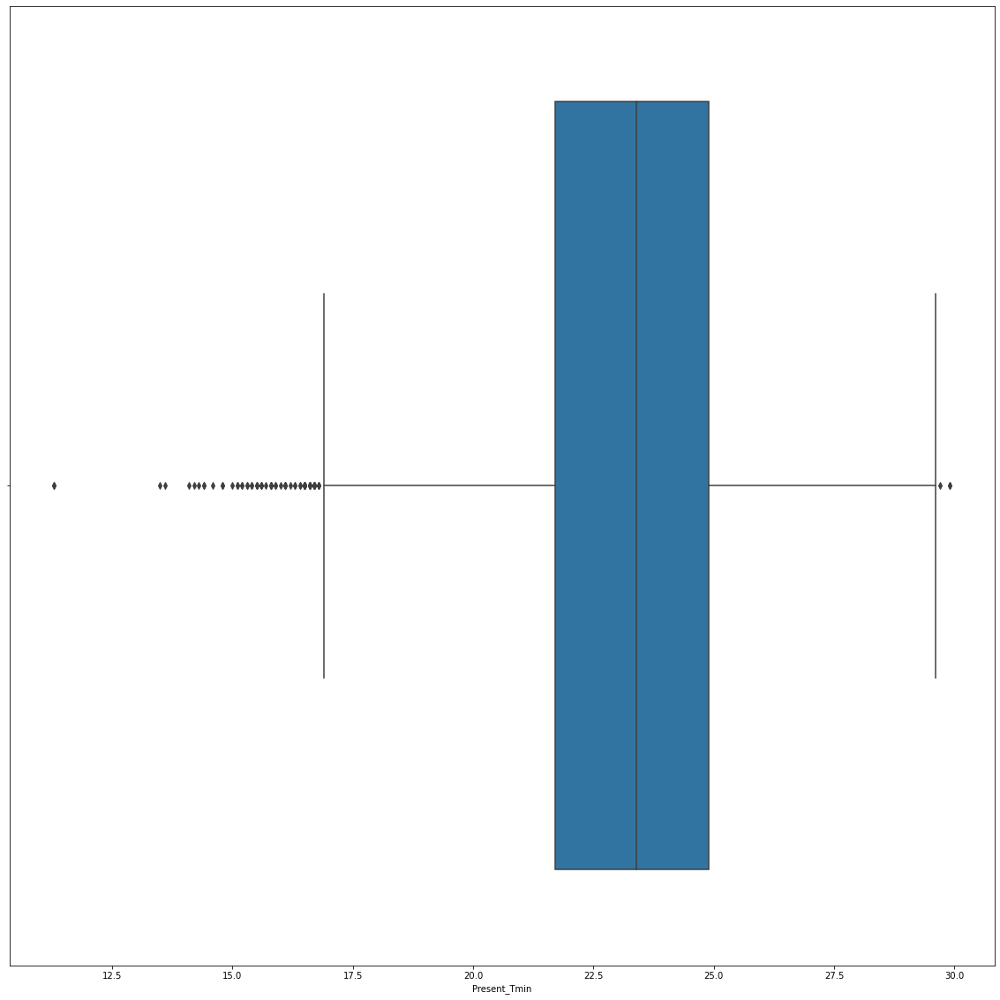

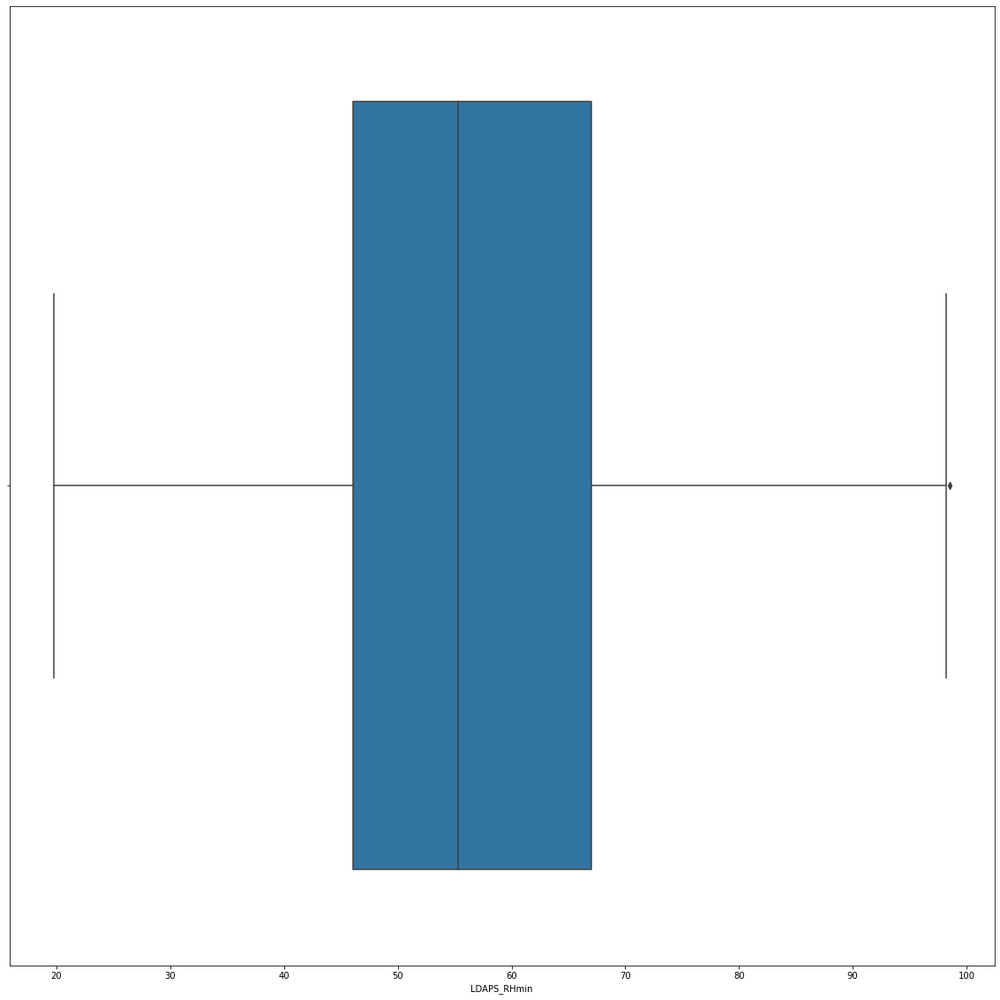

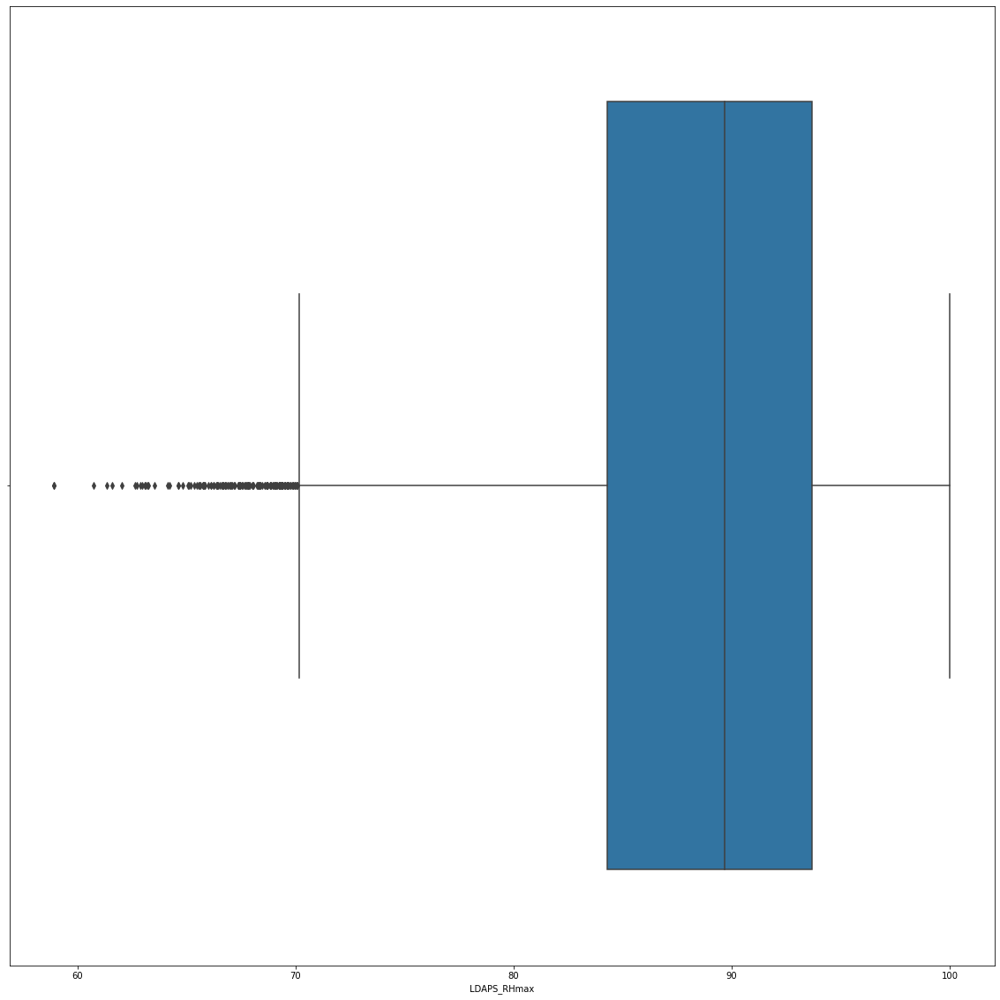

...

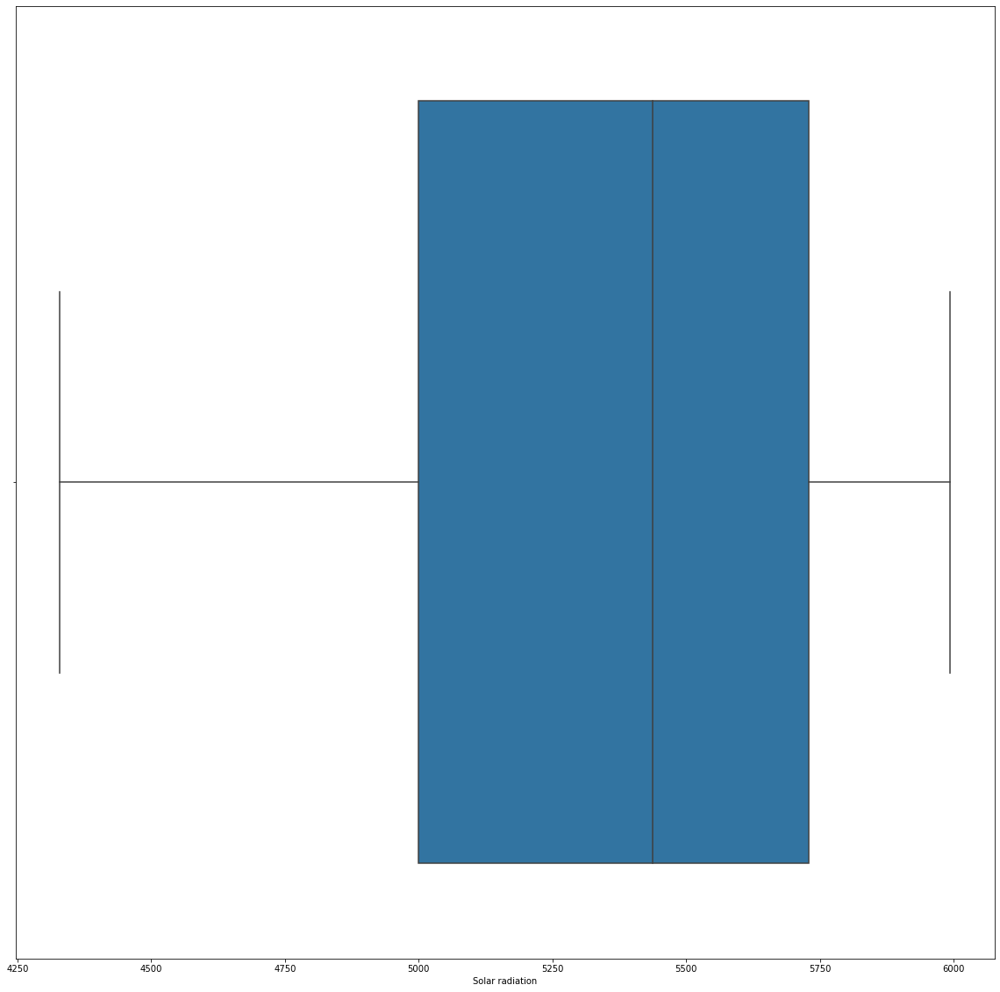

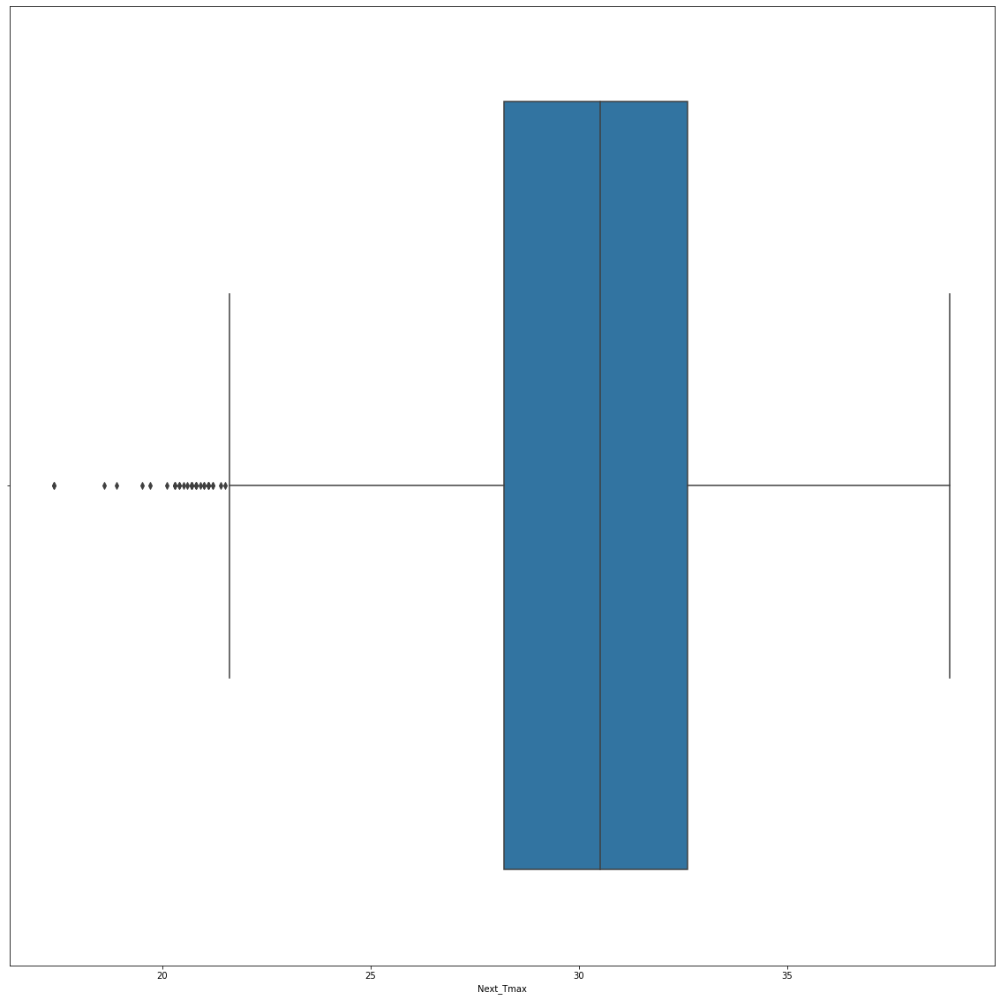

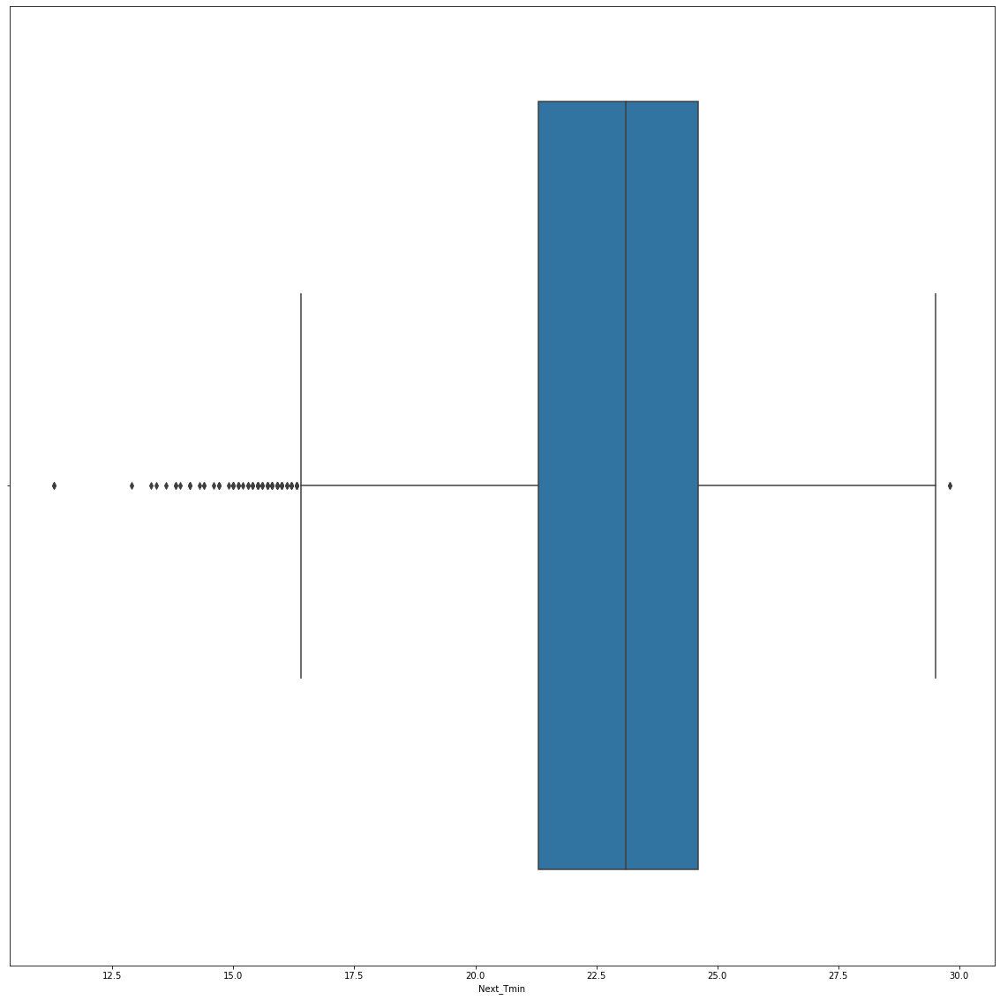

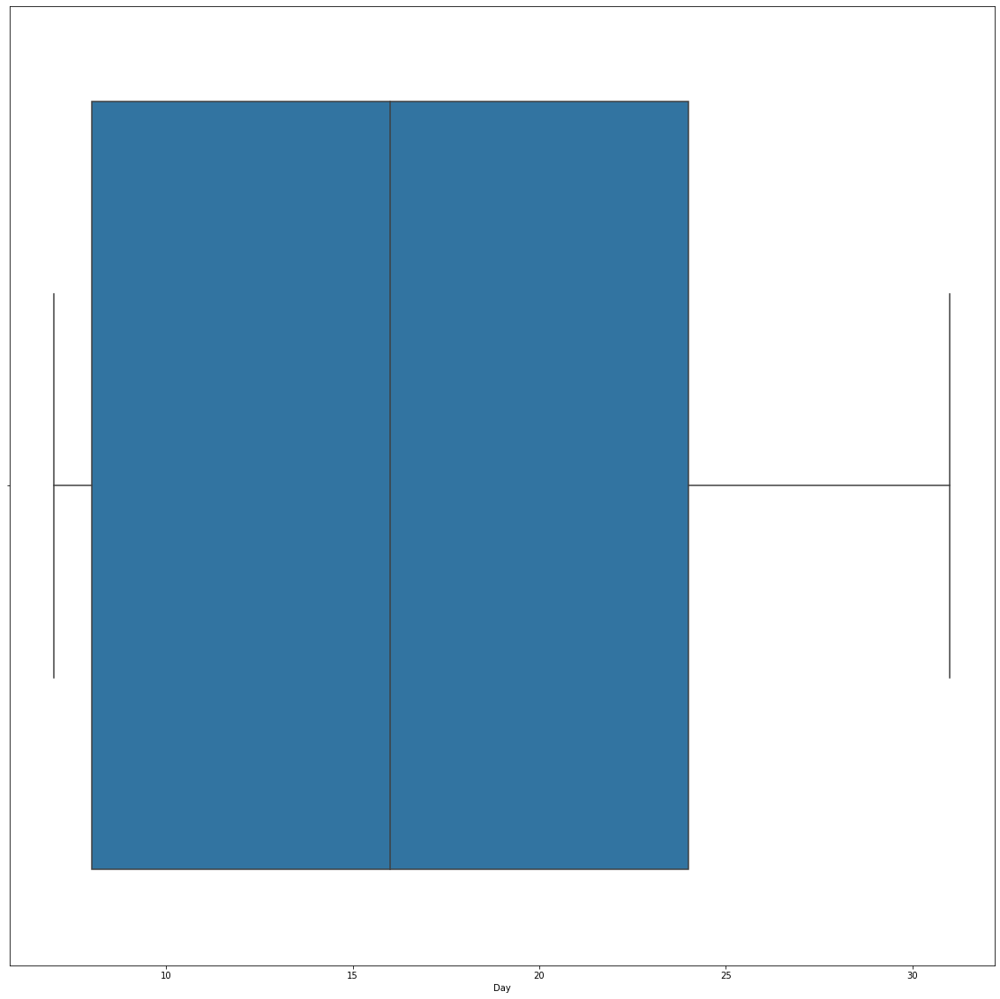

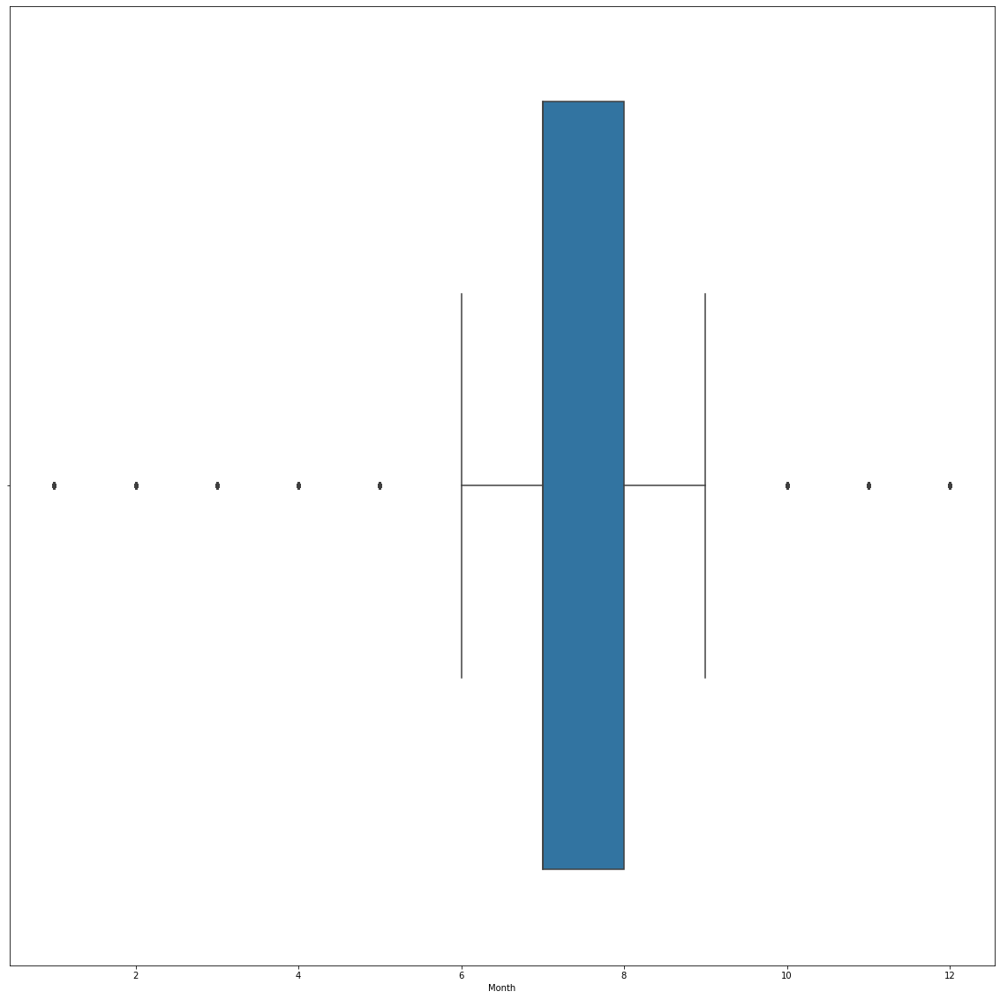

In [57]:
for i in df.columns:
    plt.figure(figsize=[20,20])
    sns.boxplot(df[i])
    plt.show()

# Removing the Outliers

In [58]:
from scipy.stats import zscore

In [59]:
z=np.abs(zscore(df))

In [63]:
df_1=df[(z<3).all(axis=1)]

In [64]:
df_1.shape

(6869, 26)

In [62]:
df.shape

(7725, 26)

Data loss is 11 percent.so we cannot remove the outliers by zscore method.

In [65]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month'],
      dtype='object')

In [67]:
for i in df.columns:
    IQR=df[i].quantile(0.75)-df[i].quantile(0.25)
    lower_bridge=df[i].quantile(0.25)-(IQR*1.5)
    upper_bridge=df[i].quantile(0.75)+(IQR*1.5)
    print('Lower bridge for',i,lower_bridge),print('Upper bridge for',i,upper_bridge)

Lower bridge for station -11.0
Upper bridge for station 37.0
Lower bridge for Present_Tmax 21.5
Upper bridge for Present_Tmax 38.3
Lower bridge for Present_Tmin 16.9
Upper bridge for Present_Tmin 29.699999999999996
Lower bridge for LDAPS_RHmin 14.617521284999992
Upper bridge for LDAPS_RHmin 98.42417716500002
Lower bridge for LDAPS_RHmax 70.17146683000001
Upper bridge for LDAPS_RHmax 107.82408523000001
Lower bridge for LDAPS_Tmax_lapse 21.709803100000002
Upper bridge for LDAPS_Tmax_lapse 37.67348726
Lower bridge for LDAPS_Tmin_lapse 17.58274103
Upper bridge for LDAPS_Tmin_lapse 29.66683751
Lower bridge for LDAPS_WS 2.2208907454999993
Upper bridge for LDAPS_WS 11.462504093500002
Lower bridge for LDAPS_LH -32.21374332000002
Upper bridge for LDAPS_LH 153.56418324000003
Lower bridge for LDAPS_CC1 -0.4867477035
Upper bridge for LDAPS_CC1 1.2065236845
Lower bridge for LDAPS_CC2 -0.4755352159999999
Upper bridge for LDAPS_CC2 1.1722021759999999
Lower bridge for LDAPS_CC3 -0.48258548549999997
Up

In [68]:
data=df.copy()

In [69]:
data.loc[data['Present_Tmax']<21.5,'Present_Tmax'] = 21.5

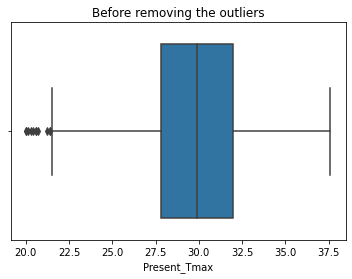

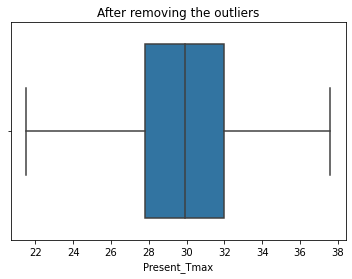

In [72]:
sns.boxplot(df['Present_Tmax'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['Present_Tmax'])
plt.title('After removing the outliers')
plt.show()

In [73]:
data.loc[data['Present_Tmin']<16.9,'Present_Tmin'] = 16.9
data.loc[data['Present_Tmin']>29.699999999999996,'Present_Tmin'] = 29.699999999999996

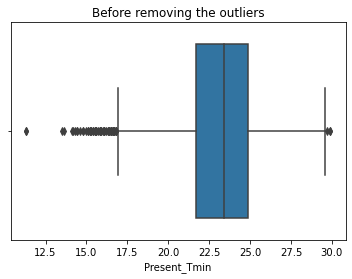

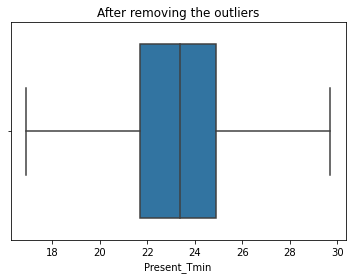

In [74]:
sns.boxplot(df['Present_Tmin'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['Present_Tmin'])
plt.title('After removing the outliers')
plt.show()

In [75]:
data.loc[data['LDAPS_RHmax']<70.17146683000001,'LDAPS_RHmax'] = 70.17146683000001

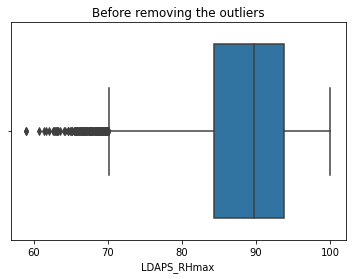

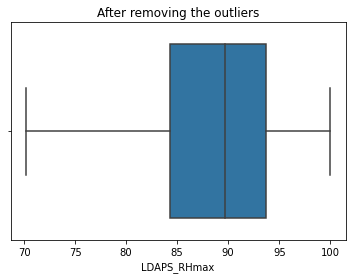

In [76]:
sns.boxplot(df['LDAPS_RHmax'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_RHmax'])
plt.title('After removing the outliers')
plt.show()

In [77]:
data.loc[data['LDAPS_Tmax_lapse']<21.709803100000002,'LDAPS_Tmax_lapse'] = 21.709803100000002
data.loc[data['LDAPS_Tmax_lapse']>37.67348726,'LDAPS_Tmax_lapse'] = 37.67348726

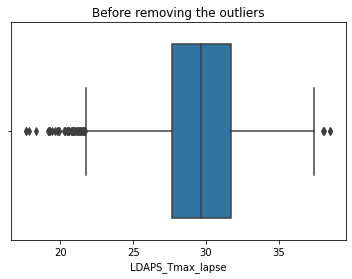

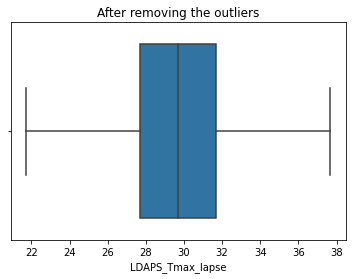

In [78]:
sns.boxplot(df['LDAPS_Tmax_lapse'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_Tmax_lapse'])
plt.title('After removing the outliers')
plt.show()

In [80]:
data.loc[data['LDAPS_Tmin_lapse']<17.58274103,'LDAPS_Tmin_lapse'] = 17.58274103

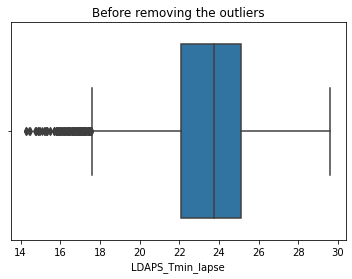

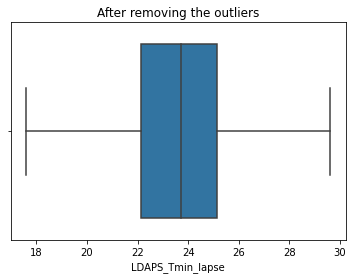

In [81]:
sns.boxplot(df['LDAPS_Tmin_lapse'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_Tmin_lapse'])
plt.title('After removing the outliers')
plt.show()

In [82]:
data.loc[data['LDAPS_WS']>11.462504093500002,'LDAPS_WS'] = 11.462504093500002

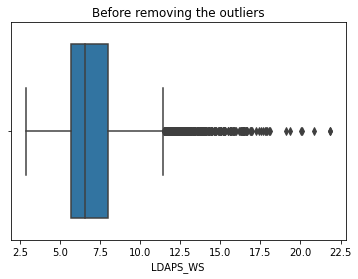

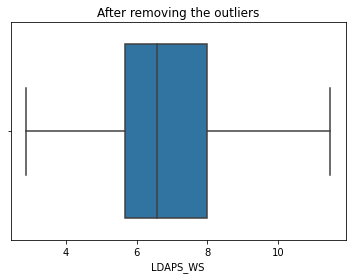

In [83]:
sns.boxplot(df['LDAPS_WS'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_WS'])
plt.title('After removing the outliers')
plt.show()

In [84]:
data.loc[data['LDAPS_LH']>153.56418324000003,'LDAPS_LH'] = 153.56418324000003

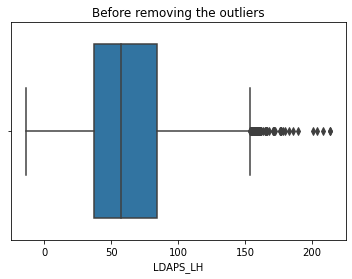

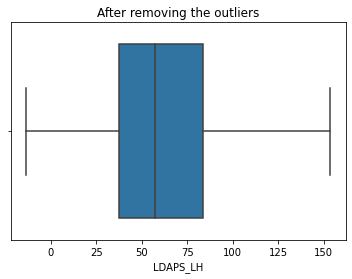

In [85]:
sns.boxplot(df['LDAPS_LH'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_LH'])
plt.title('After removing the outliers')
plt.show()

In [87]:
data.loc[data['LDAPS_PPT1']>0.1678708325,'LDAPS_PPT1'] = 0.1678708325

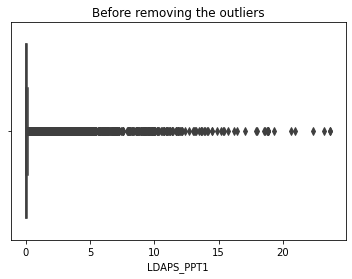

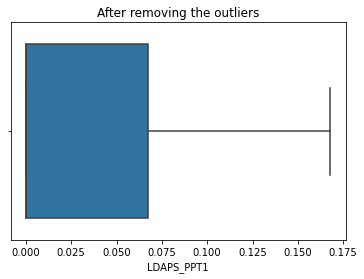

In [88]:
sns.boxplot(df['LDAPS_PPT1'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_PPT1'])
plt.title('After removing the outliers')
plt.show()

In [89]:
data.loc[data['LDAPS_PPT2']>0.0600873325,'LDAPS_PPT2'] = 0.0600873325

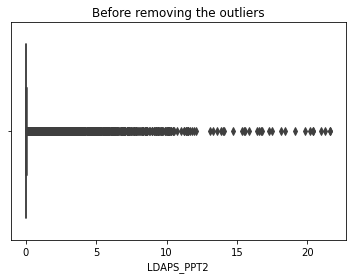

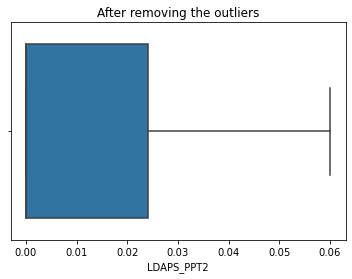

In [90]:
sns.boxplot(df['LDAPS_PPT2'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_PPT2'])
plt.title('After removing the outliers')
plt.show()

In [91]:
data.loc[data['LDAPS_PPT3']>0.02412198,'LDAPS_PPT3'] = 0.02412198

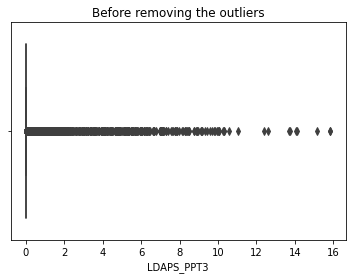

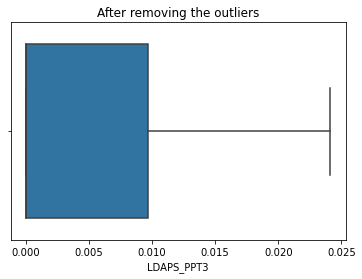

In [92]:
sns.boxplot(df['LDAPS_PPT3'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_PPT3'])
plt.title('After removing the outliers')
plt.show()

In [93]:
data.loc[data['LDAPS_PPT4']>0.0017576175000000001,'LDAPS_PPT4'] = 0.0017576175000000001

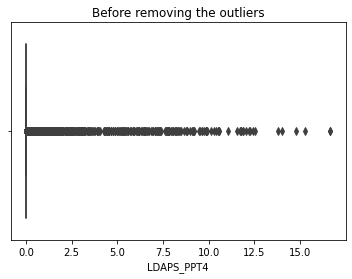

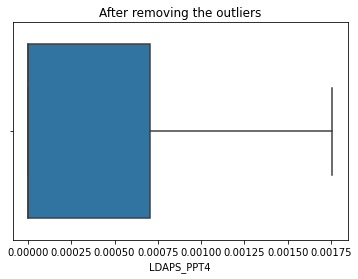

In [94]:
sns.boxplot(df['LDAPS_PPT4'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['LDAPS_PPT4'])
plt.title('After removing the outliers')
plt.show()

In [95]:
data.loc[data['DEM']>106.531,'DEM'] = 106.531

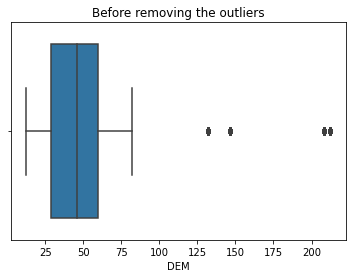

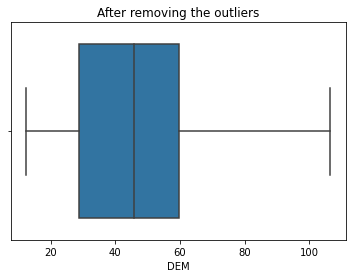

In [96]:
sns.boxplot(df['DEM'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['DEM'])
plt.title('After removing the outliers')
plt.show()

In [97]:
data.loc[data['Slope']>4.01255,'Slope'] = 4.01255

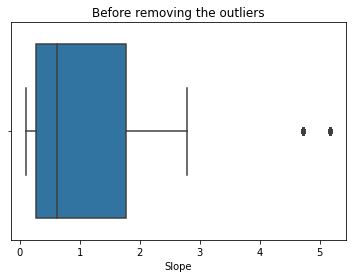

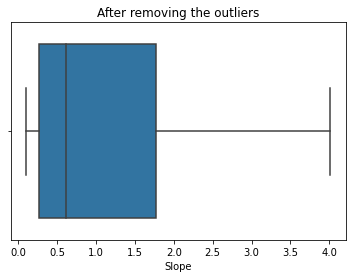

In [98]:
sns.boxplot(df['Slope'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['Slope'])
plt.title('After removing the outliers')
plt.show()

In [99]:
data.loc[data['Month']<5.5,'Month'] = 5.5
data.loc[data['Month']>9.5,'Month'] = 9.5

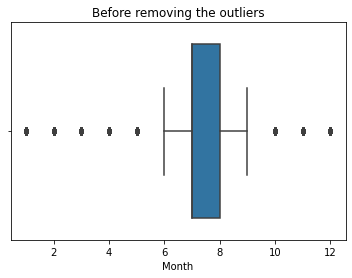

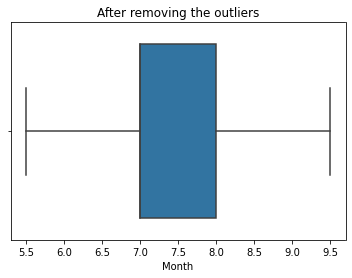

In [100]:
sns.boxplot(df['Month'])
plt.title('Before removing the outliers')
plt.show()

sns.boxplot(data['Month'])
plt.title('After removing the outliers')
plt.show()

In [101]:
df=data

# Splitting the dataset

In [145]:
x=df.drop(['Next_Tmax','Next_Tmin'],axis=1)

In [146]:
y=df[['Next_Tmax','Next_Tmin']]

# Checking and removing the skewness

In [147]:
x.skew()

station            -0.002774
Present_Tmax       -0.255483
Present_Tmin       -0.259459
LDAPS_RHmin         0.302995
LDAPS_RHmax        -0.734432
LDAPS_Tmax_lapse   -0.840258
LDAPS_Tmin_lapse   -0.411311
LDAPS_WS            0.808523
LDAPS_LH            0.597272
LDAPS_CC1           0.460584
LDAPS_CC2           0.475248
LDAPS_CC3           0.642254
LDAPS_CC4           0.666292
LDAPS_PPT1          1.177668
LDAPS_PPT2          1.174894
LDAPS_PPT3          1.169048
LDAPS_PPT4          1.159465
lat                 0.086587
lon                -0.286558
DEM                 0.728551
Slope               1.178708
Solar radiation    -0.513787
Day                 0.245795
Month               0.056479
dtype: float64

In [148]:
from sklearn.preprocessing import power_transform

In [149]:
df_x = power_transform(x, method='yeo-johnson')        
df_x= pd.DataFrame(df_x, columns = x.columns)

In [150]:
df_x.skew()

station            -0.205649
Present_Tmax       -0.035878
Present_Tmin       -0.021698
LDAPS_RHmin        -0.017146
LDAPS_RHmax        -0.114261
LDAPS_Tmax_lapse    0.025776
LDAPS_Tmin_lapse   -0.027800
LDAPS_WS            0.016079
LDAPS_LH            0.041181
LDAPS_CC1           0.046902
LDAPS_CC2           0.045534
LDAPS_CC3           0.087881
LDAPS_CC4           0.126562
LDAPS_PPT1          0.989227
LDAPS_PPT2          1.022534
LDAPS_PPT3          1.018980
LDAPS_PPT4          1.131081
lat                 0.000000
lon                -0.199755
DEM                -0.021244
Slope               0.214116
Solar radiation    -0.177610
Day                -0.041666
Month              -0.022052
dtype: float64

In [161]:
df_x['LDAPS_PPT1'] = np.cbrt(df_x['LDAPS_PPT1'])

In [162]:
df_x['LDAPS_PPT2'] = np.cbrt(df_x['LDAPS_PPT2'])

In [163]:
df_x['LDAPS_PPT3'] = np.cbrt(df_x['LDAPS_PPT3'])

In [164]:
df_x['LDAPS_PPT4'] = np.cbrt(df_x['LDAPS_PPT4'])

In [165]:
df_x.skew()

station            -0.205649
Present_Tmax       -0.035878
Present_Tmin       -0.021698
LDAPS_RHmin        -0.017146
LDAPS_RHmax        -0.114261
LDAPS_Tmax_lapse    0.025776
LDAPS_Tmin_lapse   -0.027800
LDAPS_WS            0.016079
LDAPS_LH            0.041181
LDAPS_CC1           0.046902
LDAPS_CC2           0.045534
LDAPS_CC3           0.087881
LDAPS_CC4           0.126562
LDAPS_PPT1          0.880437
LDAPS_PPT2          0.922087
LDAPS_PPT3          0.921969
LDAPS_PPT4          1.116580
lat                 0.000000
lon                -0.199755
DEM                -0.021244
Slope               0.214116
Solar radiation    -0.177610
Day                -0.041666
Month              -0.022052
dtype: float64

In [166]:
x=df_x

# Scaling the data

In [167]:
from sklearn.preprocessing import StandardScaler

In [168]:
sc=StandardScaler()

In [169]:
dfx=sc.fit_transform(x)

In [170]:
dfx=pd.DataFrame(x,columns=x.columns)

# Finding the best random state

In [171]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [172]:
maxr2=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=i)
    lm=LinearRegression()
    lm.fit(x_train,y_train)
    lm.score(x_train,y_train)
    lm.score(x_test,y_test)
    ypred=lm.predict(x_test)
    acc=r2_score(y_test,ypred)
    if acc>maxr2:
        maxr2=acc
        maxRS=i
print('Best accuracy is',maxr2, 'for random state',maxRS)

Best accuracy is 0.8024544604866524 for random state 185


In [173]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [175]:
lm=LinearRegression()
dtc=DecisionTreeRegressor()
rf=RandomForestRegressor()

model =[lm,dtc,rf]
for i in model:
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=185)
    i.fit(x_train,y_train)
    pred=i.predict(x_test)
    print('R2 score for',i, 'is',r2_score(pred,y_test))
    print('Mean squared error is',mean_squared_error(pred,y_test))
    print('Mean absolute error is',mean_absolute_error(pred,y_test))
    cvs=cross_val_score(i,x,y,cv=5)
    print('Cross validation score for',i, 'is',cvs.mean())
    print('Difference between R2 score and Cross Validation Score is',r2_score(pred,y_test) - cvs.mean())
    print('\t')
    print('\t')

R2 score for LinearRegression() is 0.7377352487671067
Mean squared error is 1.7255760772476907
Mean absolute error is 0.9937942005130223
Cross validation score for LinearRegression() is 0.723119482845937
Difference between R2 score and Cross Validation Score is 0.014615765921169754
	
	
R2 score for DecisionTreeRegressor() is 0.7745544308147909
Mean squared error is 1.8516676470588251
Mean absolute error is 0.9920882352941165
Cross validation score for DecisionTreeRegressor() is 0.43898349667280556
Difference between R2 score and Cross Validation Score is 0.33557093414198536
	
	
R2 score for RandomForestRegressor() is 0.8880692667144514
Mean squared error is 0.7608161238235296
Mean absolute error is 0.6608808823529417
Cross validation score for RandomForestRegressor() is 0.709399717155326
Difference between R2 score and Cross Validation Score is 0.1786695495591254
	
	


Linear Regression has got least difference between R2 score and Cross validation score.

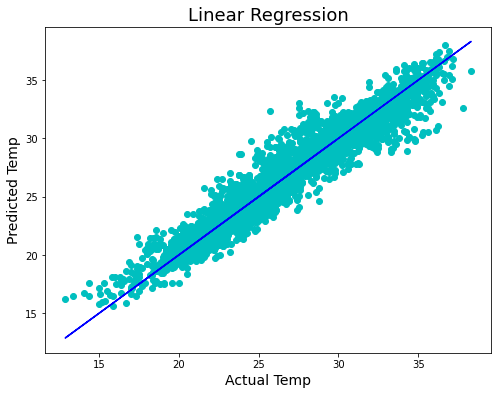

In [176]:
plt.figure(figsize=[8,6])
plt.scatter(x=y_test,y=lm.predict(x_test),color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual Temp', fontsize=14)
plt.ylabel('Predicted Temp', fontsize=14)
plt.title('Linear Regression', fontsize=18)
plt.show()

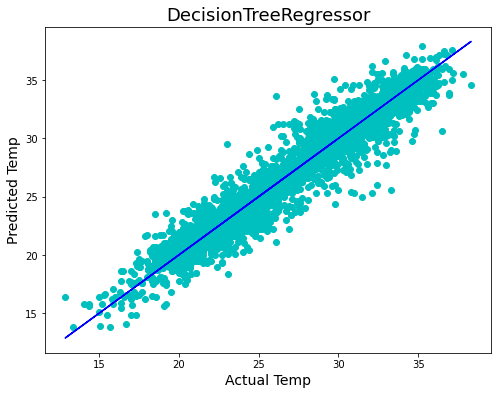

In [189]:
plt.figure(figsize=[8,6])
plt.scatter(x=y_test,y=dtc.predict(x_test),color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual Temp', fontsize=14)
plt.ylabel('Predicted Temp', fontsize=14)
plt.title('DecisionTreeRegressor', fontsize=18)
plt.show()

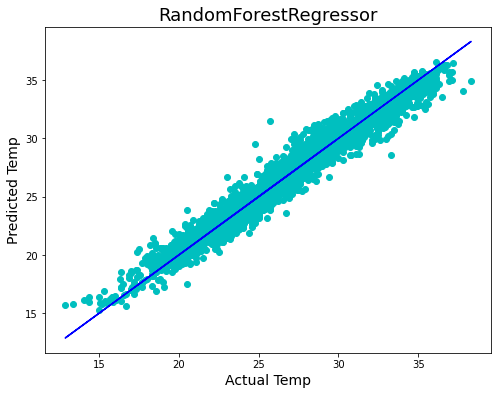

In [190]:
plt.figure(figsize=[8,6])
plt.scatter(x=y_test,y=rf.predict(x_test),color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual Temp', fontsize=14)
plt.ylabel('Predicted Temp', fontsize=14)
plt.title('RandomForestRegressor', fontsize=18)
plt.show()

# Regularization

In [179]:
from sklearn.model_selection import GridSearchCV

In [180]:
from sklearn.linear_model import Lasso
parameters = {'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.001, 'random_state': 0}


In [181]:
ls=Lasso(alpha=0.001,random_state=0)
ls.fit(x_train,y_train)
ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)
lss=r2_score(y_test,pred_ls)
lss

0.8024493151367305

In [182]:
cv_score=cross_val_score(ls,x,y,cv=5)
cv_mean=cv_score.mean()
cv_mean

0.7235123901013492

# Hyperparameter tuning for RandomForestRegressor

In [184]:
param_grid = {'criterion':['mse','mae'],'max_features':['auto','sqrt','log2']}

In [186]:
gcv = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3)
gcv.fit(x_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'],
                         'max_features': ['auto', 'sqrt', 'log2']})

In [187]:
gcv.best_params_

{'criterion': 'mse', 'max_features': 'sqrt'}

In [188]:
rfr = RandomForestRegressor(random_state=185, max_features='sqrt',criterion='mse')
rfr.fit(x_train, y_train)
predrfr = rfr.predict(x_test)
print (r2_score(y_test, predrfr))
print (mean_squared_error(y_test, predrfr))
print (mean_absolute_error(y_test, predrfr))

0.9190768299343111
0.6742286700000002
0.6243405882352949


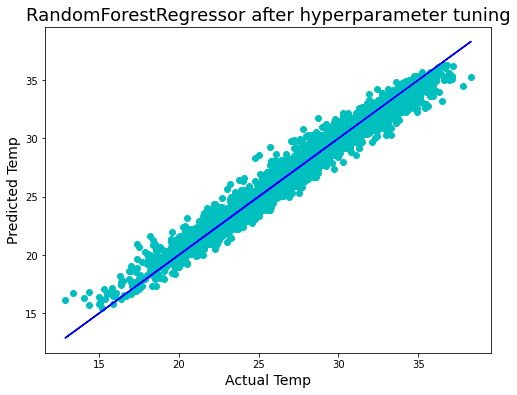

In [191]:
plt.figure(figsize=[8,6])
plt.scatter(x=y_test,y=predrfr,color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual Temp', fontsize=14)
plt.ylabel('Predicted Temp', fontsize=14)
plt.title('RandomForestRegressor after hyperparameter tuning', fontsize=18)
plt.show()

# Saving the model

In [192]:
import pickle

In [195]:
filename = 'temp.pkl'
pickle.dump(rfr, open(filename, 'wb'))

# Conclusion

In [196]:
loaded_model=pickle.load(open('temp.pkl','rb'))
result = loaded_model.score(x_test,y_test)
print(result)

0.9190768299343111
